In [1]:
import os
import sys
import ztffields
import numpy as np
import pandas as pd
import cartopy.crs as ccrs
import matplotlib.pyplot as plt

from astropy.table import Table, vstack
from astropy.io import ascii

sys.path.append('/Users/adamboesky/Research/long_transients/Source_Analysis')
sys.path.append('/Users/adamboesky/Research/long_transients')

from filter_fields import combine_stats, create_filter_flowchart
from Extracting.utils import get_n_quadrants_merged_all_fields
from Extracting.Catalogs import get_ztf_metadata_from_coords, ztf_image_exists, get_ztf_metadata_from_metadata
from Source_Analysis.Sources import Sources, Source

"Important: Gaia archive will be intermittently unavailable due to scheduled maintenance on 03-02-2025 from 11:00 to 13:00 (CET)"
CasJobs will use the credentials from mast_login_harvard.txt


/Users/adamboesky/opt/anaconda3/envs/long_transients/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Look at the sky footprint that we have extracted on

In [6]:
# Get all fields 15 arcseconds from the galactic plane
good_fields = ztffields.get_fieldid(galb_range=[[-90,-15], [15,90]], grid="main")

# Get a df for the fields, and add ccdids + qids
FIELDS = ztffields.Fields()
# Field poly is shape (fields, ccds, quadrants, quad_corners)
field_df, field_polys = FIELDS.get_field_vertices(good_fields, level='quadrant', steps=2)
field_df['ccdid'] = field_df['rcid'] // 4
field_df['qid'] = field_df['rcid'] % 4
field_df.head()

,fieldid,rcid,ccdid,qid
0,1,0,0,0
1,1,1,0,1
2,1,2,0,2
3,1,3,0,3
4,1,4,1,0


In [7]:
# Check which fields have deep images
imaged_fields = []
for fieldid in np.unique(field_df['fieldid']):
    if ztf_image_exists({'fieldid': fieldid}, verbose=0):
        imaged_fields.append(fieldid)

KeyboardInterrupt: 

In [ ]:
# Save off array
# np.save('/Users/adamboesky/Research/long_transients/Data/imaged_fields.npy', imaged_fields)

In [8]:
# Load array
imaged_fields = np.load('/Users/adamboesky/Research/long_transients/Data/imaged_fields.npy')

In [9]:
# Cut the field df down to those which have been images
field_df = field_df[np.isin(field_df['fieldid'], imaged_fields)]
field_df

,fieldid,rcid,ccdid,qid
8768,202,0,0,0
8769,202,1,0,1
8770,202,2,0,2
8771,202,3,0,3
8772,202,4,1,0
...,...,...,...,...
41659,877,59,14,3
41660,877,60,15,0
41661,877,61,15,1
41662,877,62,15,2


/Users/adamboesky/opt/anaconda3/envs/long_transients/lib/python3.12/site-packages/ztffields/plotting.py:879: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  patches = [Polygon(**fieldvert_.to_dict(), **kwargs) for i, fieldvert_ in fieldverts.iterrows()]


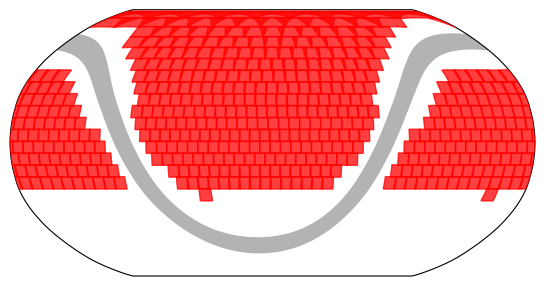

In [10]:
# Plot the fields
ztffields.skyplot_fields(imaged_fields, alpha=0.75, color='red', projection=ccrs.Robinson())
plt.show()

Get bands imaged by each field

In [28]:
bands_imaged = {'g': [], 'r': [], 'i': []}
unique_fields = np.unique(imaged_fields)
for i, fid in enumerate(unique_fields):
    metadata = get_ztf_metadata_from_metadata(
        ztf_metadata={'field': fid},
        verbose=0,
    )
    for filtercode in np.unique(metadata['filtercode']):
        bands_imaged[filtercode[1]].append(fid)

    if i % 50 == 0:
        print(f'{i} / {len(unique_fields)} checked')

0 / 485 checked
50 / 485 checked
100 / 485 checked
150 / 485 checked
200 / 485 checked
250 / 485 checked
300 / 485 checked
350 / 485 checked
400 / 485 checked
450 / 485 checked


In [34]:
fields_imaged_all_bands = np.intersect1d(ar1=bands_imaged['g'], ar2=bands_imaged['r'])
fields_imaged_all_bands = np.intersect1d(ar1=fields_imaged_all_bands, ar2=bands_imaged['i'])
len(fields_imaged_all_bands)

396

In [31]:
# Save off array
for band in bands_imaged.keys():
    np.save(f'/Users/adamboesky/Research/long_transients/Data/{band}_imaged_fields.npy', bands_imaged[band])

In [ ]:
# Load array
bands_imaged = {}
for band in bands_imaged.keys():
    bands_imaged[band] = np.load(f'/Users/adamboesky/Research/long_transients/Data/{band}_imaged_fields.npy')

/Users/adamboesky/opt/anaconda3/envs/long_transients/lib/python3.12/site-packages/ztffields/plotting.py:879: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  patches = [Polygon(**fieldvert_.to_dict(), **kwargs) for i, fieldvert_ in fieldverts.iterrows()]


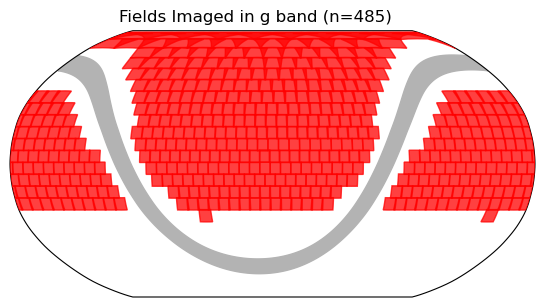

/Users/adamboesky/opt/anaconda3/envs/long_transients/lib/python3.12/site-packages/ztffields/plotting.py:879: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  patches = [Polygon(**fieldvert_.to_dict(), **kwargs) for i, fieldvert_ in fieldverts.iterrows()]


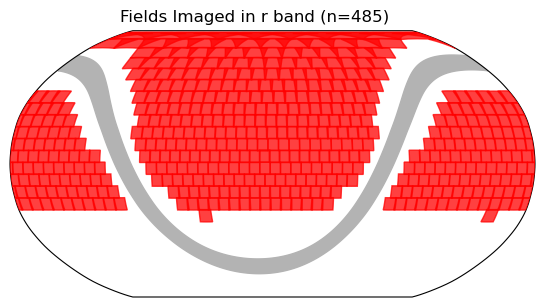

/Users/adamboesky/opt/anaconda3/envs/long_transients/lib/python3.12/site-packages/ztffields/plotting.py:879: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  patches = [Polygon(**fieldvert_.to_dict(), **kwargs) for i, fieldvert_ in fieldverts.iterrows()]


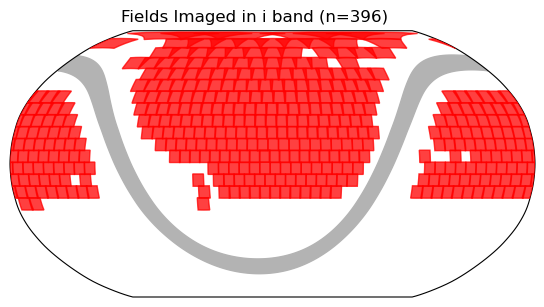

In [30]:
# Plot the fields
for band in bands_imaged.keys():
    ztffields.skyplot_fields(bands_imaged[band], alpha=0.75, color='red', projection=ccrs.Robinson())
    plt.suptitle(f'Fields Imaged in {band} band (n={len(bands_imaged[band])})')
    plt.show()

/Users/adamboesky/opt/anaconda3/envs/long_transients/lib/python3.12/site-packages/ztffields/plotting.py:879: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  patches = [Polygon(**fieldvert_.to_dict(), **kwargs) for i, fieldvert_ in fieldverts.iterrows()]


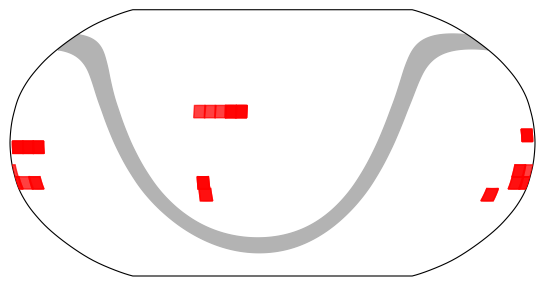

In [7]:
# Plot the fields that we have extracted on so far
ztffields.skyplot_fields([
    int(fname[:6]) for fname in os.listdir('/Users/adamboesky/Research/long_transients/Data/catalog_results/field_results')
], alpha=0.75, color='red', projection=ccrs.Robinson())
plt.show()

In [ ]:
# Get the total area that our extraction covers
n_quadrants_all_fields = get_n_quadrants_merged_all_fields()
print(n_quadrants_all_fields)
total_deg_covered = 0
for field in imaged_fields:
    total_deg_covered += 0.73 * np.max([n_quadrants_all_fields[field]['g'], n_quadrants_all_fields[field]['r'], n_quadrants_all_fields[field]['i']])
print(f'{total_deg_covered} deg^2')

{'000502': {'g': 43, 'r': 41, 'i': 42}, '000499': {'g': 10, 'r': 10, 'i': 9}, '000806': {'g': 3, 'r': 3, 'i': 1}, '000512': {'g': 4, 'r': 4, 'i': 4}, '000500': {'g': 46, 'r': 46, 'i': 44}, '000503': {'g': 5, 'r': 5, 'i': 4}, '000513': {'g': 2, 'r': 2, 'i': 2}, '000501': {'g': 47, 'r': 45, 'i': 44}, '000511': {'g': 3, 'r': 3, 'i': 0}}
118.99 deg^2


# Loading and combining field results into singular files

In [2]:
# Combine the graphs of all the fields
stat_dfs = {0: [], 1: [], 2: []}
g_tabs = {0: [], 1: [], 2: []}
r_tabs = {0: [], 1: [], 2: []}
i_tabs = {0: [], 1: [], 2: []}
g_wide_tabs = {0: [], 1: [], 2: []}
r_wide_tabs = {0: [], 1: [], 2: []}
i_wide_tabs = {0: [], 1: [], 2: []}

filter_dir = '/Users/adamboesky/Research/long_transients/Data/filter_results'
for field_dirname in os.listdir(filter_dir):
    if field_dirname == 'combined' or field_dirname not in [  # fields that Adam is look at right now
        '000292',
        '000581',
        '000445',
        '000578',
        '000276',
        '000446',
        '000582',
        '000294',
        '000444',
        '000293',
        '000246',
        '000245',
    ]:
        continue

    for cat_num in stat_dfs.keys():
        df = pd.read_csv(os.path.join(filter_dir, field_dirname, f'{cat_num}_filter_stats.csv'))
        df.loc[pd.isnull(df['branch']), 'branch'] = ''
        stat_dfs[cat_num].append(df)

        if os.path.exists(os.path.join(filter_dir, field_dirname, f'{cat_num}_g.ecsv')):
            g_tabs[cat_num].append(ascii.read(os.path.join(filter_dir, field_dirname, f'{cat_num}_g.ecsv')))
        if os.path.exists(os.path.join(filter_dir, field_dirname, f'{cat_num}_r.ecsv')):
            r_tabs[cat_num].append(ascii.read(os.path.join(filter_dir, field_dirname, f'{cat_num}_r.ecsv')))
        if os.path.exists(os.path.join(filter_dir, field_dirname, f'{cat_num}_i.ecsv')):
            i_tabs[cat_num].append(ascii.read(os.path.join(filter_dir, field_dirname, f'{cat_num}_i.ecsv')))

        if os.path.exists(os.path.join(filter_dir, field_dirname, f'{cat_num}_wide_association_g.ecsv')):
            g_wide_tabs[cat_num].append(ascii.read(os.path.join(filter_dir, field_dirname, f'{cat_num}_wide_association_g.ecsv')))
        if os.path.exists(os.path.join(filter_dir, field_dirname, f'{cat_num}_wide_association_r.ecsv')):
            r_wide_tabs[cat_num].append(ascii.read(os.path.join(filter_dir, field_dirname, f'{cat_num}_wide_association_r.ecsv')))
        if os.path.exists(os.path.join(filter_dir, field_dirname, f'{cat_num}_wide_association_i.ecsv')):
            i_wide_tabs[cat_num].append(ascii.read(os.path.join(filter_dir, field_dirname, f'{cat_num}_wide_association_i.ecsv')))


combined_stats = {}
combined_g_tabs = {}
combined_r_tabs = {}
combined_i_tabs = {}
combined_g_wide_tabs = {}
combined_r_wide_tabs = {}
combined_i_wide_tabs = {}

empty_table = Table(names=g_tabs[0][0].colnames, dtype=[col.dtype for col in g_tabs[0][0].columns.values()])

for cat_num in stat_dfs.keys():
    combined_stats[cat_num] = combine_stats(stat_dfs[cat_num])
    
    # TODO: temporary for bad pstarr extraction
    if cat_num != 2:
        combined_g_tabs[cat_num] = vstack(g_tabs[cat_num])
        combined_r_tabs[cat_num] = vstack(r_tabs[cat_num])
        combined_i_tabs[cat_num] = vstack(i_tabs[cat_num])

        combined_g_wide_tabs[cat_num] = empty_table.copy() if len(g_wide_tabs[cat_num]) == 0 else vstack(g_wide_tabs[cat_num])
        combined_r_wide_tabs[cat_num] = empty_table.copy() if len(r_wide_tabs[cat_num]) == 0 else vstack(r_wide_tabs[cat_num])
        combined_i_wide_tabs[cat_num] = empty_table.copy() if len(i_wide_tabs[cat_num]) == 0 else vstack(i_wide_tabs[cat_num])

/var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/ipykernel_16152/1462534762.py:30: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  df.loc[pd.isnull(df['branch']), 'branch'] = ''
/var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/ipykernel_16152/1462534762.py:30: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  df.loc[pd.isnull(df['branch']), 'branch'] = ''
/var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/ipykernel_16152/1462534762.py:30: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '' has dtype incompatible with float64, please explicitly cast to a compatible dtype 

In [3]:
# Create flowcharts and save
for cat_num, stats_df in combined_stats.items():
    fchart = create_filter_flowchart(stats_df)
    fchart.save(f'/Users/adamboesky/Research/long_transients/Data/filter_results/combined/{cat_num}_combined.pdf')

    if cat_num != 2:
        combined_g_tabs[cat_num].write(f'/Users/adamboesky/Research/long_transients/Data/filter_results/combined/{cat_num}_g.ecsv', overwrite=True)
        combined_r_tabs[cat_num].write(f'/Users/adamboesky/Research/long_transients/Data/filter_results/combined/{cat_num}_r.ecsv', overwrite=True)
        combined_i_tabs[cat_num].write(f'/Users/adamboesky/Research/long_transients/Data/filter_results/combined/{cat_num}_i.ecsv', overwrite=True)

        combined_g_wide_tabs[cat_num].write(f'/Users/adamboesky/Research/long_transients/Data/filter_results/combined/{cat_num}_wide_g.ecsv', overwrite=True)
        combined_r_wide_tabs[cat_num].write(f'/Users/adamboesky/Research/long_transients/Data/filter_results/combined/{cat_num}_wide_r.ecsv', overwrite=True)
        combined_i_wide_tabs[cat_num].write(f'/Users/adamboesky/Research/long_transients/Data/filter_results/combined/{cat_num}_wide_i.ecsv', overwrite=True)

# Examining candidates

## Detected in both

In [13]:
srcs = Sources(
    ras=combined_g_tabs[0]['ra'],
    decs=combined_g_tabs[0]['dec'],
    field_catalogs={
        'g': combined_g_tabs[0],
        'r': combined_r_tabs[0],
        'i': combined_i_tabs[0],
    }
)

<SkyCoord (ICRS): (ra, dec) in deg
    (199.06591586, 22.4361109)>


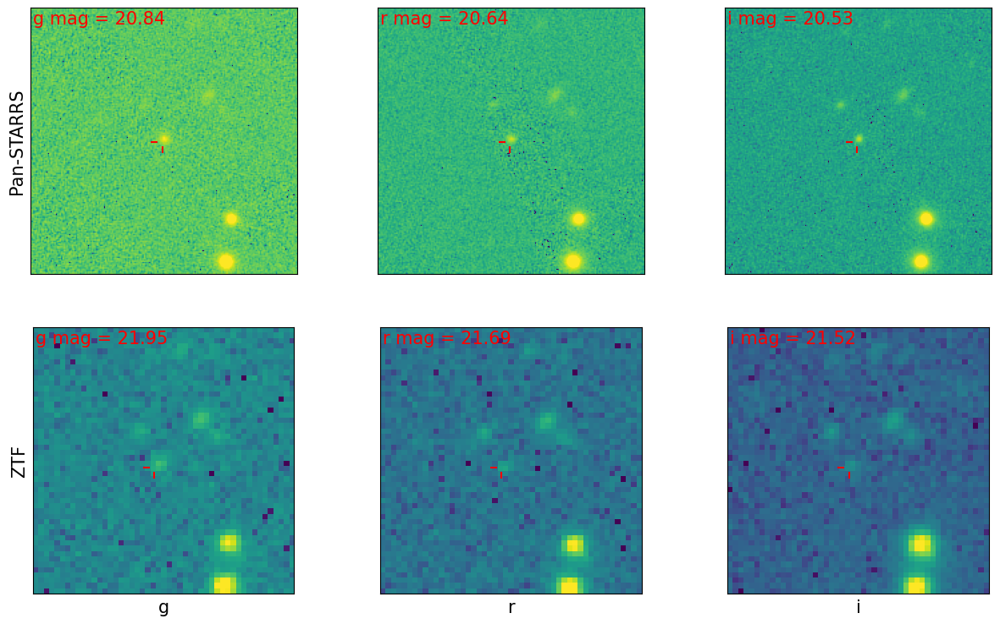

Querying ztf catalog for light curve...
Querying wise catalog for light curve...
Querying ptf catalog for light curve...


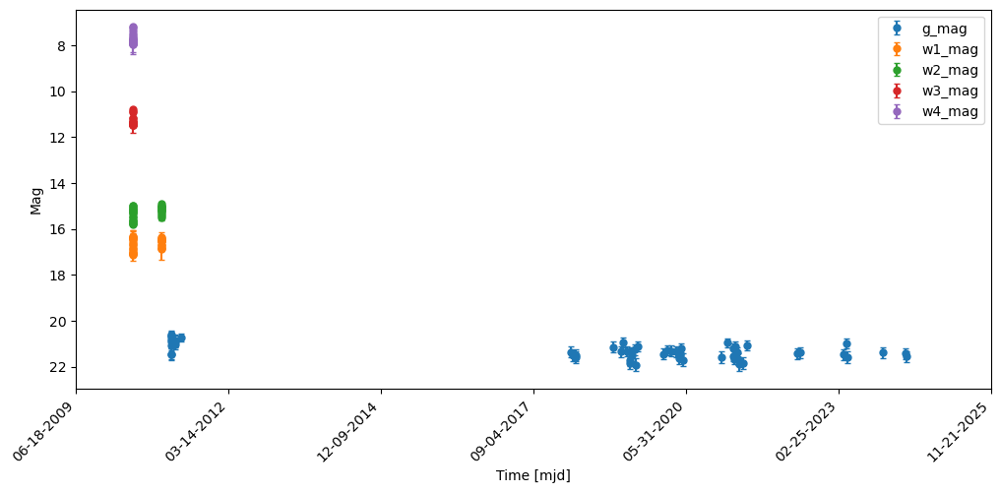

<SkyCoord (ICRS): (ra, dec) in deg
    (224.6767341, -26.97622826)>


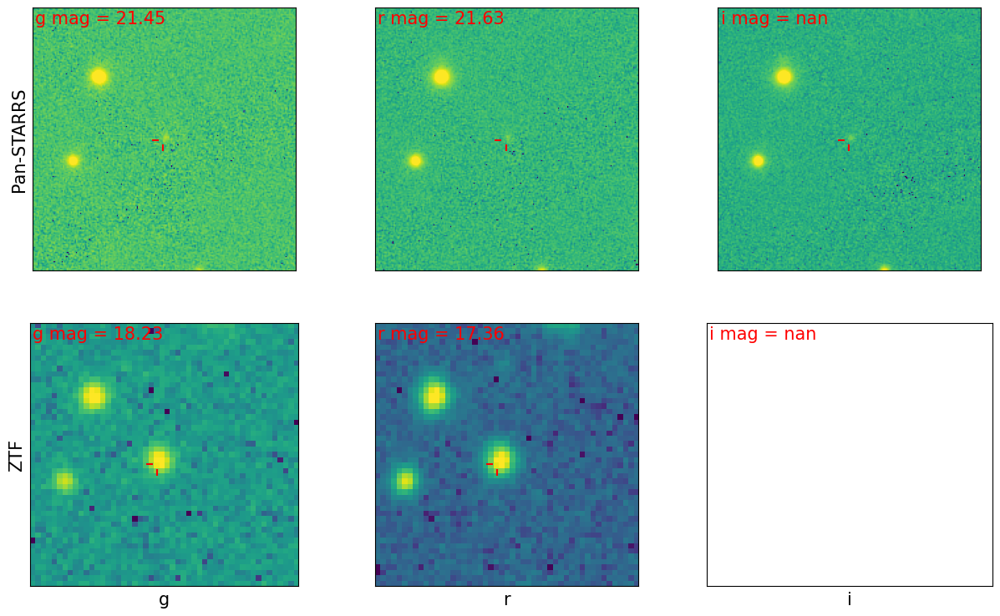

Querying ztf catalog for light curve...Querying wise catalog for light curve...

Querying ptf catalog for light curve...


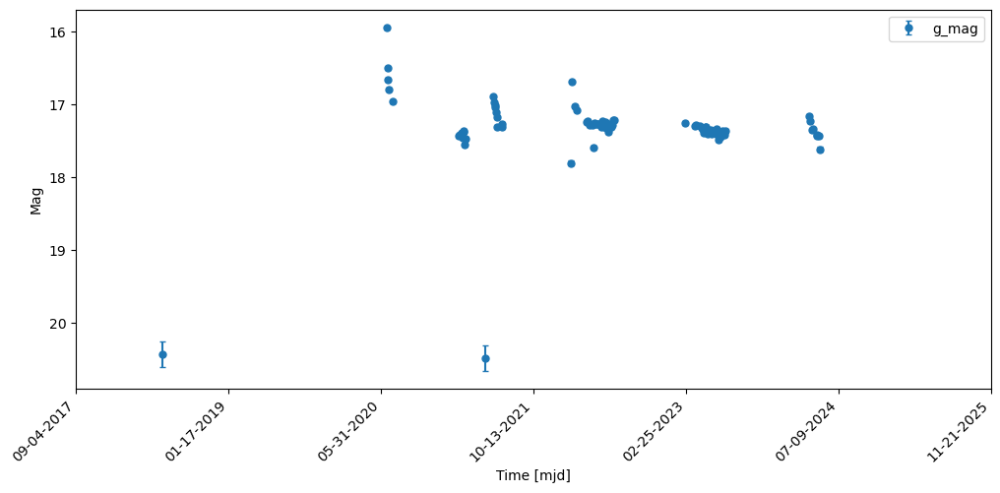

<SkyCoord (ICRS): (ra, dec) in deg
    (224.9857578, -27.41386133)>


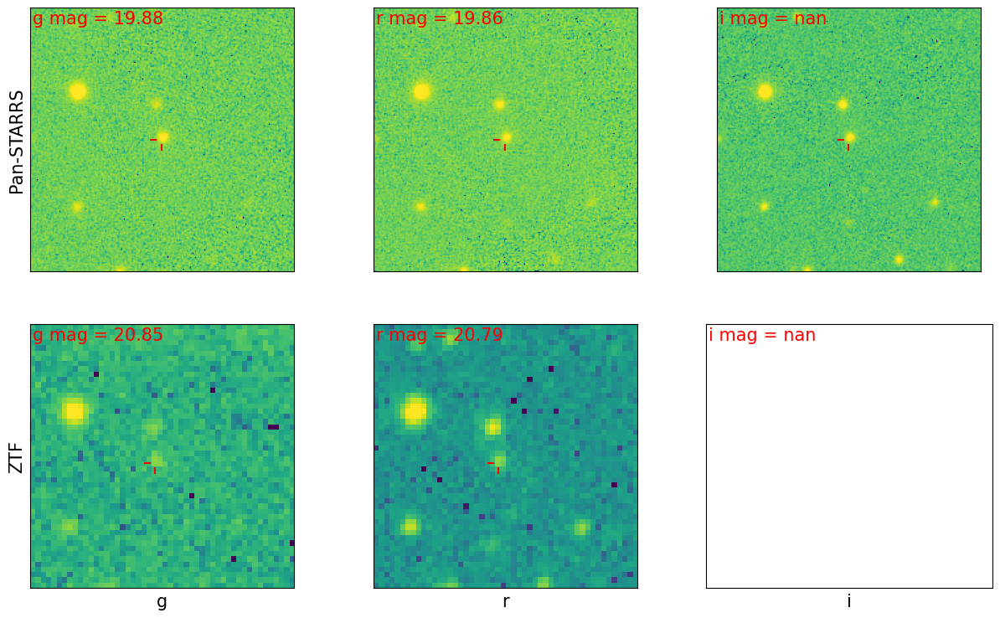

Querying ztf catalog for light curve...
Querying wise catalog for light curve...
Querying ptf catalog for light curve...


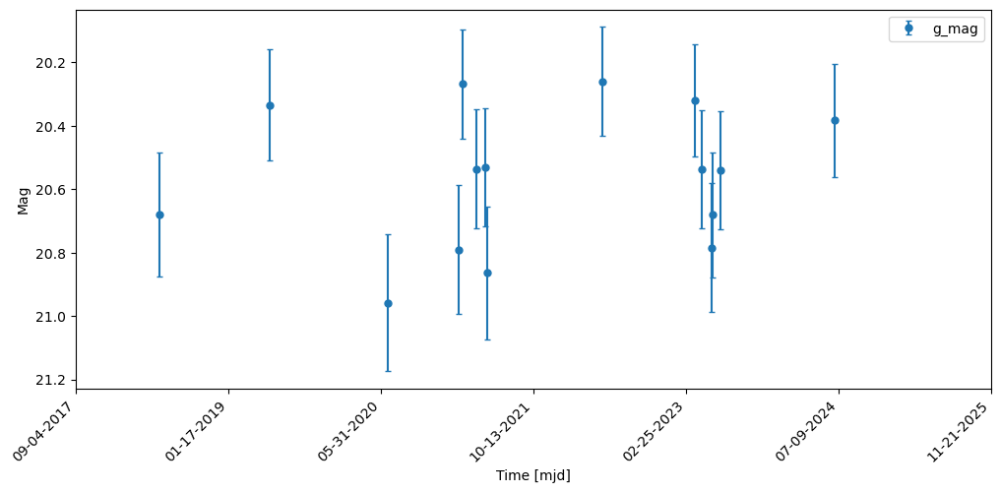

<SkyCoord (ICRS): (ra, dec) in deg
    (224.86691008, -27.85023105)>


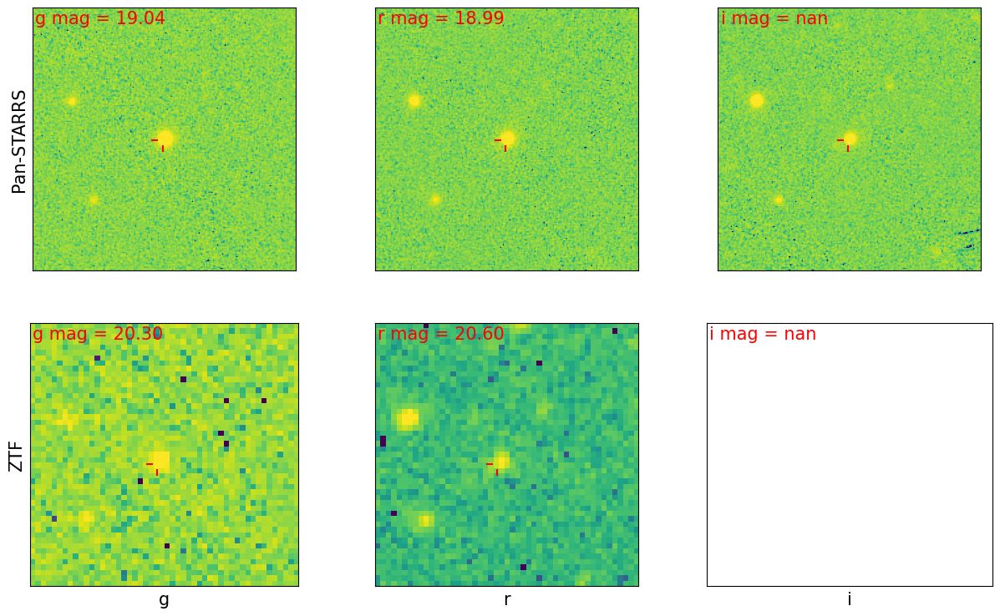

Querying ztf catalog for light curve...
Querying wise catalog for light curve...
Querying ptf catalog for light curve...


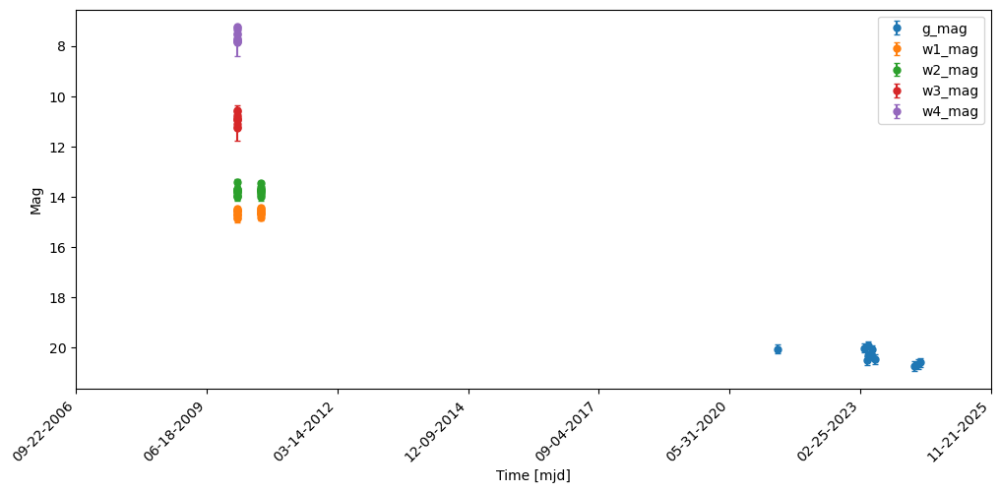

<SkyCoord (ICRS): (ra, dec) in deg
    (351.03013138, 0.88661736)>


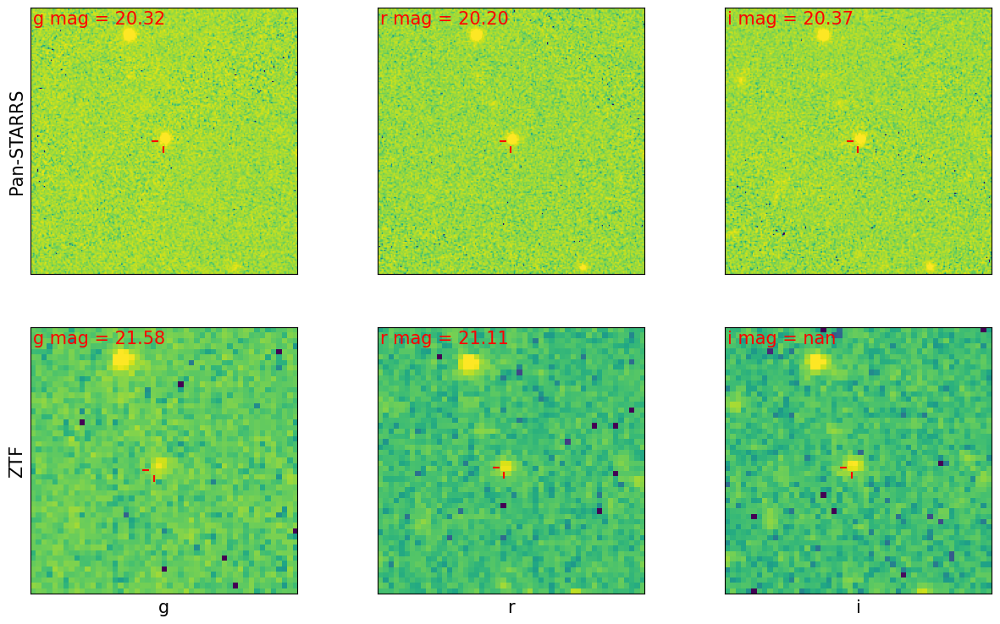

Querying ztf catalog for light curve...
Querying wise catalog for light curve...
Querying ptf catalog for light curve...


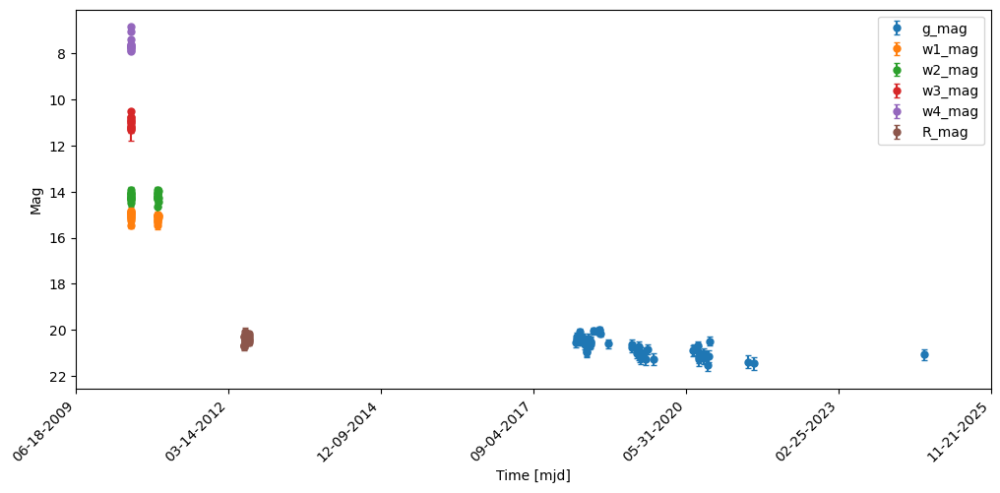

In [15]:
for src in srcs[:5]:
    print(src.coord)
    src.plot_all_cutouts()
    plt.show()
    src.plot_lc()
    plt.show()

## Detected in just ZTF

In [7]:
srcs_ztf = Sources(
    ras=combined_g_tabs[1]['ra'],
    decs=combined_g_tabs[1]['dec'],
    field_catalogs={
        'g': combined_g_tabs[1],
        'r': combined_r_tabs[1],
        'i': combined_i_tabs[1],
    }
)

<SkyCoord (ICRS): (ra, dec) in deg
    (358.13683537, -2.88488545)>
INFO: Query finished. [astroquery.utils.tap.core]
parallax_over_error     pm    pmra_error pmdec_error
                     mas / yr  mas / yr    mas / yr 
------------------- --------- ---------- -----------
          405.74484 698.70105 0.10176762  0.06021723
Skipping because of pm or parallax
<SkyCoord (ICRS): (ra, dec) in deg
    (355.34801555, -4.85357754)>
INFO: Query finished. [astroquery.utils.tap.core]
parallax_over_error    pm     pmra_error pmdec_error
                    mas / yr   mas / yr    mas / yr 
------------------- -------- ----------- -----------
          338.23666 435.6982 0.052413657  0.05175409
Skipping because of pm or parallax
<SkyCoord (ICRS): (ra, dec) in deg
    (358.14864698, -4.80016213)>
INFO: Query finished. [astroquery.utils.tap.core]
parallax_over_error    pm    pmra_error pmdec_error
                    mas / yr  mas / yr    mas / yr 
------------------- -------- ---------- --------

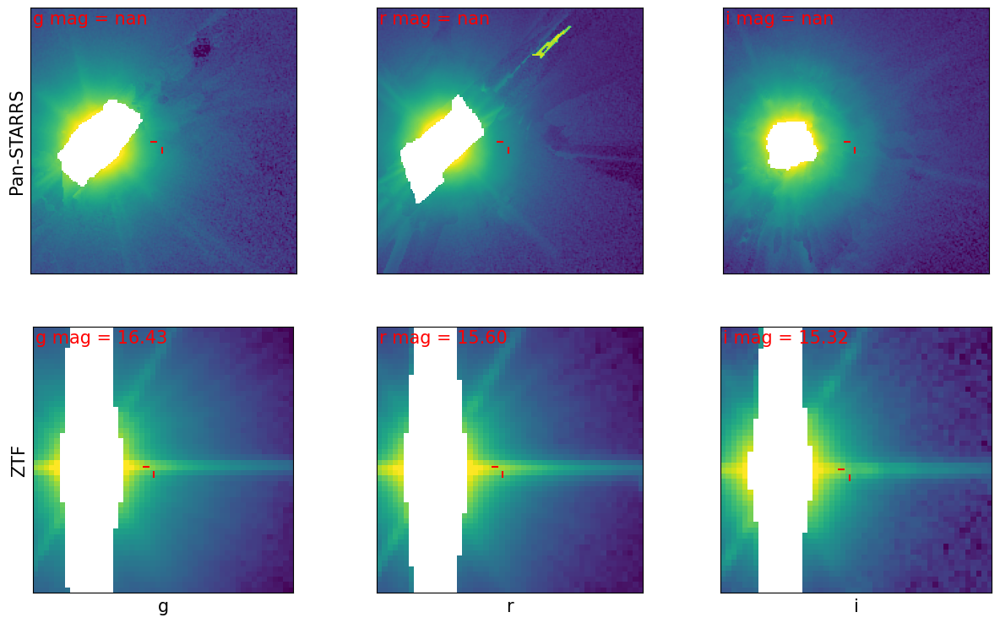

Querying ztf catalog for light curve...
Querying wise catalog for light curve...
Querying ptf catalog for light curve...


/Users/adamboesky/opt/anaconda3/envs/long_transients/lib/python3.12/site-packages/erfa/core.py:133: ErfaWarning: ERFA function "d2dtf" yielded 6 of "dubious year (Note 5)"
  warn(f'ERFA function "{func_name}" yielded {wmsg}', ErfaWarning)
/Users/adamboesky/Research/long_transients/Source_Analysis/Sources.py:816: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


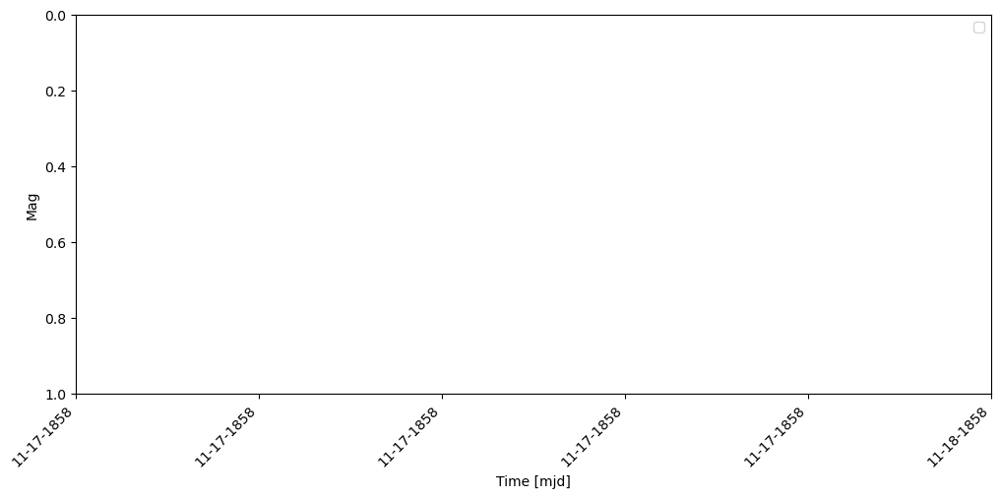

<SkyCoord (ICRS): (ra, dec) in deg
    (357.38937676, -5.5532491)>
INFO: Query finished. [astroquery.utils.tap.core]
parallax_over_error    pm    pmra_error pmdec_error
                    mas / yr  mas / yr    mas / yr 
------------------- -------- ---------- -----------
Searching for source in the catalogs!
Searching g...
Searching r...
Searching i...
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=field=000446+AND+ccdid=01+AND+qid=3

Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpji8ewwd3/ztf_000446_zr_c01_q3_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpc8v1f40x/ztf_000446_zg_c01_q3_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmp4gvwfg3p/ztf_000446_zi_c01_q3_refimg.fits


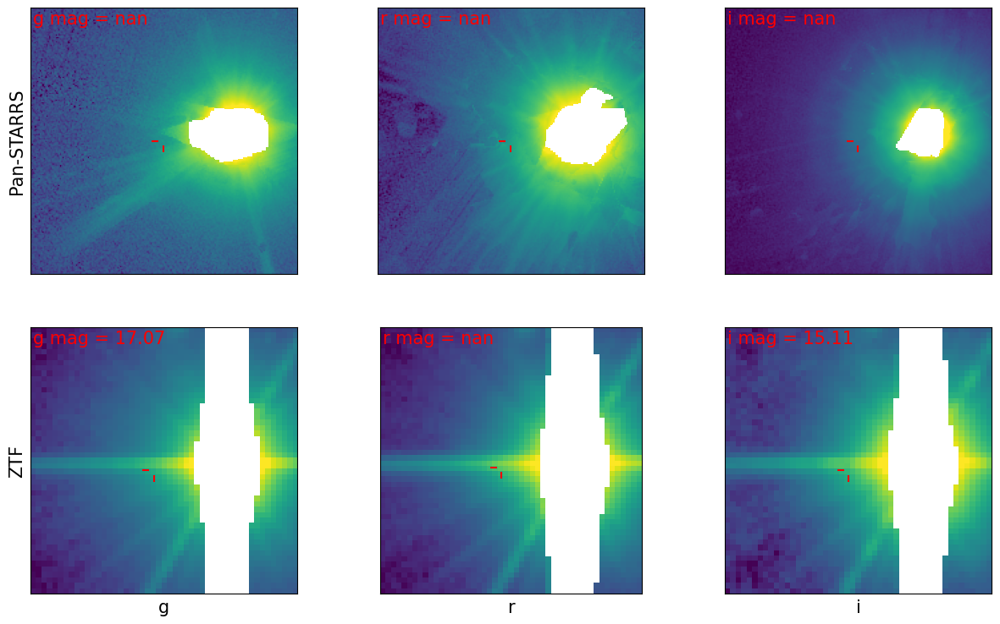

Querying ztf catalog for light curve...
Querying wise catalog for light curve...
Querying ptf catalog for light curve...


/Users/adamboesky/opt/anaconda3/envs/long_transients/lib/python3.12/site-packages/erfa/core.py:133: ErfaWarning: ERFA function "d2dtf" yielded 6 of "dubious year (Note 5)"
  warn(f'ERFA function "{func_name}" yielded {wmsg}', ErfaWarning)
/Users/adamboesky/Research/long_transients/Source_Analysis/Sources.py:816: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


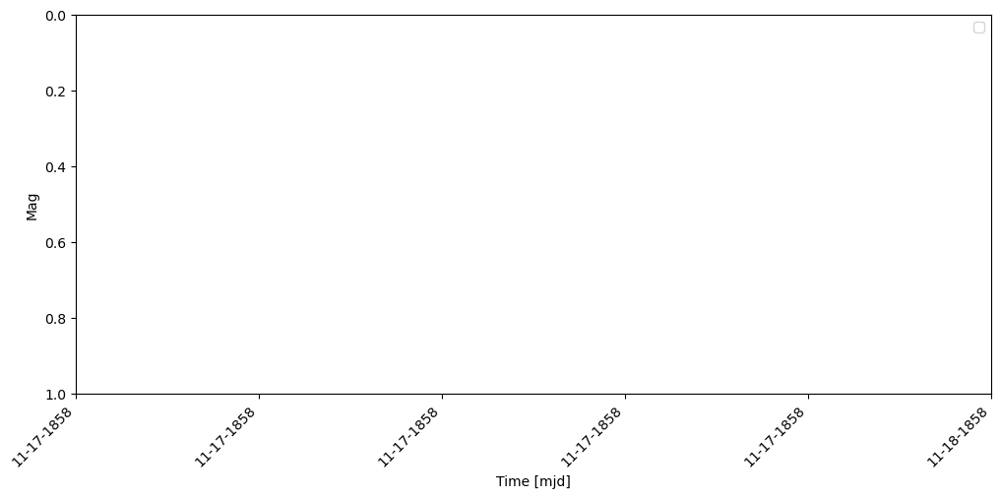

<SkyCoord (ICRS): (ra, dec) in deg
    (352.93958914, -3.4435586)>
INFO: Query finished. [astroquery.utils.tap.core]
parallax_over_error     pm     pmra_error pmdec_error
                     mas / yr   mas / yr    mas / yr 
------------------- --------- ----------- -----------
          590.40466 433.02444 0.033800244  0.02960332
Skipping because of pm or parallax
<SkyCoord (ICRS): (ra, dec) in deg
    (351.84038165, -1.23706956)>
INFO: Query finished. [astroquery.utils.tap.core]
parallax_over_error     pm    pmra_error pmdec_error
                     mas / yr  mas / yr    mas / yr 
------------------- --------- ---------- -----------
           105.3254 317.07623 0.05803245 0.043583233
Skipping because of pm or parallax


In [8]:
for src in srcs_ztf[::-1][:10]:
    print(src.coord)
    print(src.GAIA_info[['parallax_over_error', 'pm', 'pmra_error', 'pmdec_error']])
    if len(src.GAIA_info['parallax_over_error']) > 0:
        if (
            src.GAIA_info['parallax_over_error'][0] > 5.0 or 
            src.GAIA_info['parallax_over_error'][0] / (src.GAIA_info['pmra_error'] + src.GAIA_info['pmdec_error']) > 5.0
        ):
            print('Skipping because of pm or parallax')
            continue
    axes = src.plot_all_cutouts()
    plt.show()
    src.plot_lc()
    plt.show()

Detected in ZTF with a 1-3'' counterpart in Pan-STARRS

In [10]:
srcs_ztf_wide = Sources(
    ras=combined_r_wide_tabs[1]['ra'],
    decs=combined_r_wide_tabs[1]['dec'],
    field_catalogs={
        'g': combined_g_wide_tabs[1],
        'r': combined_r_wide_tabs[1],
        'i': combined_i_wide_tabs[1],
    }
)
len(srcs_ztf_wide)

8

Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>89.47768097680851+AND+ra<90.36656987680853+AND+dec>13.046071318539868+AND+dec<13.934960218539869+AND+filtercode='zg'
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>89.47768097680851+AND+ra<90.36656987680853+AND+dec>13.046071318539868+AND+dec<13.934960218539869+AND+filtercode='zr'
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>89.47768097680851+AND+ra<90.36656987680853+AND+dec>13.046071318539868+AND+dec<13.934960218539869+AND+filtercode='zi'
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmp9yorp3v5/ztf_000512_zg_c12_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmp9yorp3v5/ztf_000512_zr_c12_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmp9yorp3v5/ztf_000512_zi_c12_q1_refimg.fits
Sear

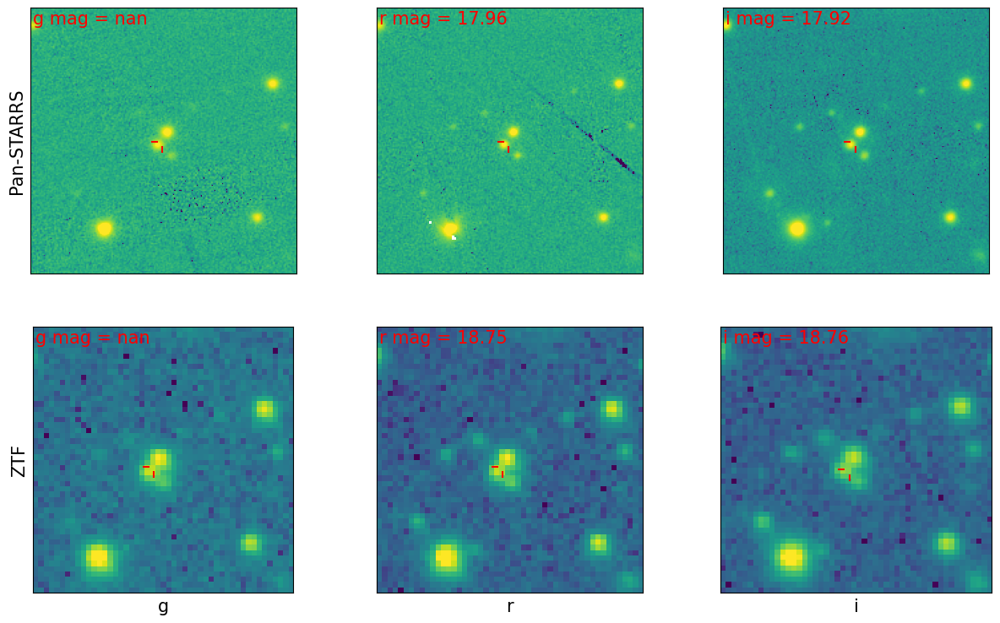

Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>89.80948185126726+AND+ra<90.69837075126728+AND+dec>13.033896587615354+AND+dec<13.922785487615355+AND+filtercode='zg'
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>89.80948185126726+AND+ra<90.69837075126728+AND+dec>13.033896587615354+AND+dec<13.922785487615355+AND+filtercode='zr'
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>89.80948185126726+AND+ra<90.69837075126728+AND+dec>13.033896587615354+AND+dec<13.922785487615355+AND+filtercode='zi'
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpaqys8bi8/ztf_000512_zg_c12_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpaqys8bi8/ztf_000512_zr_c12_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpaqys8bi8/ztf_000512_zi_c12_q1_refimg.fits
Sear

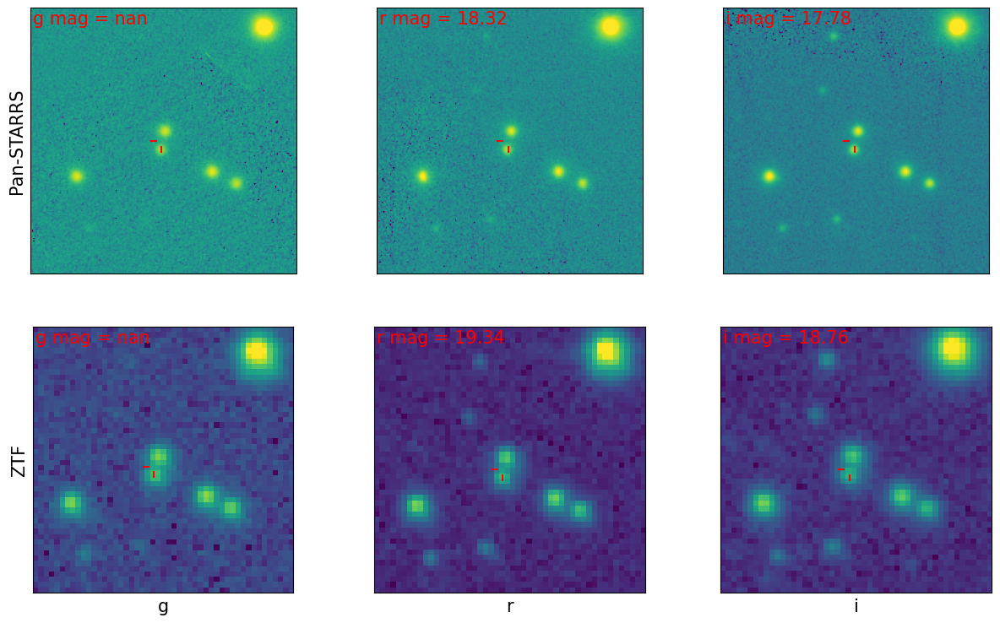

Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>89.60824976638439+AND+ra<90.4971386663844+AND+dec>12.798717317526705+AND+dec<13.687606217526707+AND+filtercode='zg'
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>89.60824976638439+AND+ra<90.4971386663844+AND+dec>12.798717317526705+AND+dec<13.687606217526707+AND+filtercode='zr'
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>89.60824976638439+AND+ra<90.4971386663844+AND+dec>12.798717317526705+AND+dec<13.687606217526707+AND+filtercode='zi'
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpq5_3suzs/ztf_000512_zg_c12_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpq5_3suzs/ztf_000512_zr_c12_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpq5_3suzs/ztf_000512_zi_c12_q1_refimg.fits
Searchi

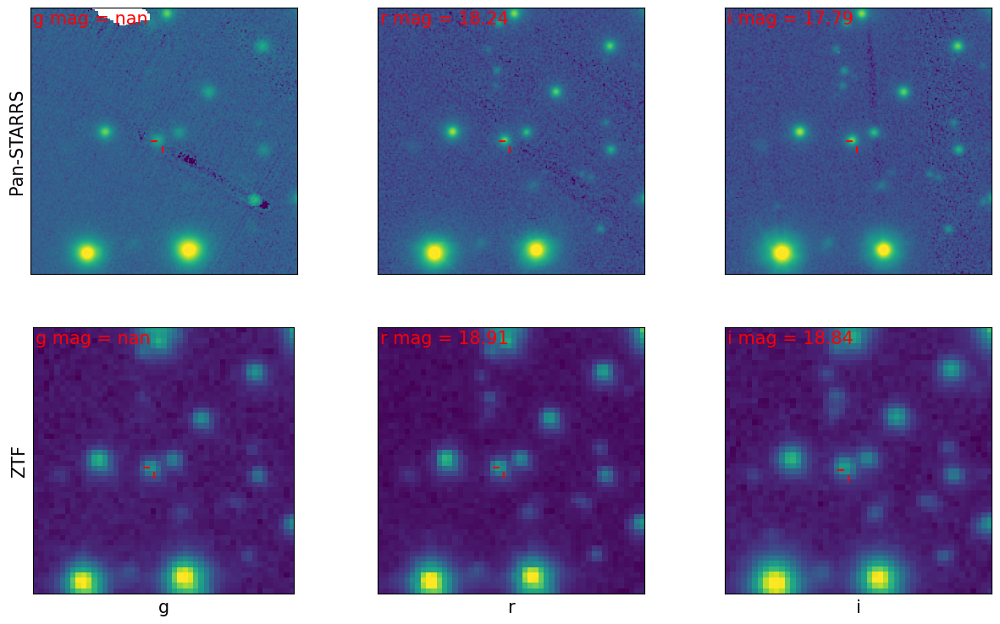

Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>95.84229616736927+AND+ra<96.73118506736928+AND+dec>13.032364574085028+AND+dec<13.921253474085029+AND+filtercode='zg'
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>95.84229616736927+AND+ra<96.73118506736928+AND+dec>13.032364574085028+AND+dec<13.921253474085029+AND+filtercode='zr'
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>95.84229616736927+AND+ra<96.73118506736928+AND+dec>13.032364574085028+AND+dec<13.921253474085029+AND+filtercode='zi'
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpzu2clpig/ztf_000512_zg_c09_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpzu2clpig/ztf_000513_zr_c12_q2_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpzu2clpig/ztf_000513_zi_c12_q2_refimg.fits
Sear

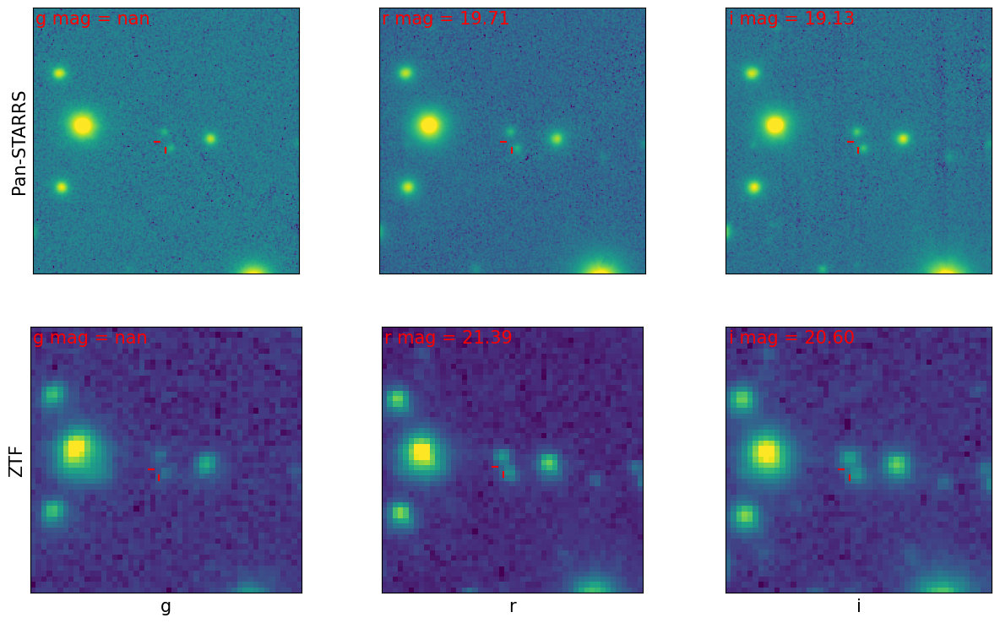

Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>96.05975348647819+AND+ra<96.9486423864782+AND+dec>12.906846724368693+AND+dec<13.795735624368694+AND+filtercode='zg'
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>96.05975348647819+AND+ra<96.9486423864782+AND+dec>12.906846724368693+AND+dec<13.795735624368694+AND+filtercode='zr'
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>96.05975348647819+AND+ra<96.9486423864782+AND+dec>12.906846724368693+AND+dec<13.795735624368694+AND+filtercode='zi'
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpuaywzx41/ztf_000513_zg_c12_q2_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpuaywzx41/ztf_000513_zr_c12_q2_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpuaywzx41/ztf_000513_zi_c12_q2_refimg.fits
Searchi

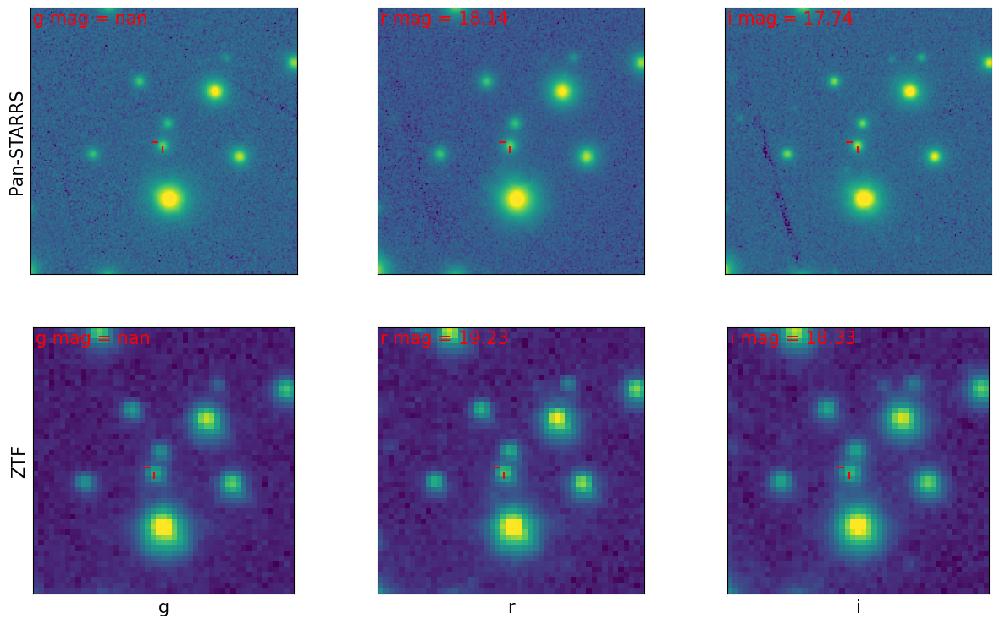

In [11]:
for src in srcs_ztf_wide[:5]:
    # try:
    axes = src.plot_all_cutouts()

    # x0, y0 = src.postage_stamps['PSTARR'].ra_dec_to_pix(src.ra, src.dec, band='g')
    # circle = plt.Circle((x0-1, y0-1), radius=12, color='red', fill=False)
    # # for i in range(axes.shape[1]):
    # axes[0][0].add_patch(circle)
    # x1, y1 = src.postage_stamps['ZTF'].ra_dec_to_pix(src.ra, src.dec, band='g')
    # circle = plt.Circle((x1-1, y1-1), radius=3, color='red', fill=False)
    # # for i in range(axes.shape[1]):
    # axes[1][0].add_patch(circle)

    # # Plot ZTF and Pan-STARR coords
    # for ax_row, func in zip(axes, [src.postage_stamps['PSTARR'].ra_dec_to_pix, src.postage_stamps['ZTF'].ra_dec_to_pix]):
    #     x_pstarr, y_pstarr = func(src.data['PSTARR_ra'], src.data['PSTARR_dec'], band='g')
    #     x_ztf, y_ztf = func(src.data['ZTF_g_ra'], src.data['ZTF_g_dec'], band='g')
    #     for ax in ax_row:
    #         ax.scatter(x_pstarr-1, y_pstarr-1, label='PSTARR', color='hotpink', marker='x')
    #         ax.scatter(x_ztf-1, y_ztf-1, label='ZTF', color='white', marker='x')

    # axes[0][-1].legend()
    # # except:
    # #     print('Encountered error, skipping...')

    plt.show()

## Detected in just Pan-STARRS

In [23]:
# Load tabs
g_tab = ascii.read('/Users/adamboesky/Research/long_transients/Data/filter_testing/testing_stuff_g.ecsv')
r_tab = ascii.read('/Users/adamboesky/Research/long_transients/Data/filter_testing/testing_stuff_r.ecsv')
i_tab = ascii.read('/Users/adamboesky/Research/long_transients/Data/filter_testing/testing_stuff_i.ecsv')

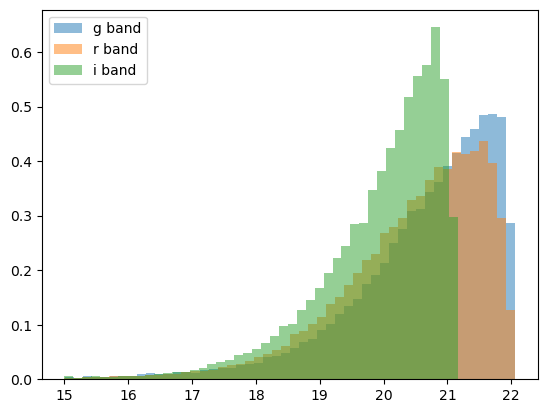

In [21]:
plt.hist(g_tab['PSTARR_gPSFMag'], density=True, alpha=0.5, bins=50, label='g band')
plt.hist(r_tab['PSTARR_rPSFMag'], density=True, alpha=0.5, bins=50, label='r band')
plt.hist(i_tab['PSTARR_iPSFMag'], density=True, alpha=0.5, bins=50, label='i band')
plt.legend()
plt.show()

In [3]:
srcs_pstarr = Sources(
    ras=g_tab['ra'],
    decs=g_tab['dec'],
    field_catalogs={
        'g': g_tab,
        'r': r_tab,
        'i': i_tab,
    },
    catch_plotting_exceptions=False,
    merged_field_basedir='/Users/adamboesky/Research/long_transients/Data/catalog_results_random_fields/field_results'
)

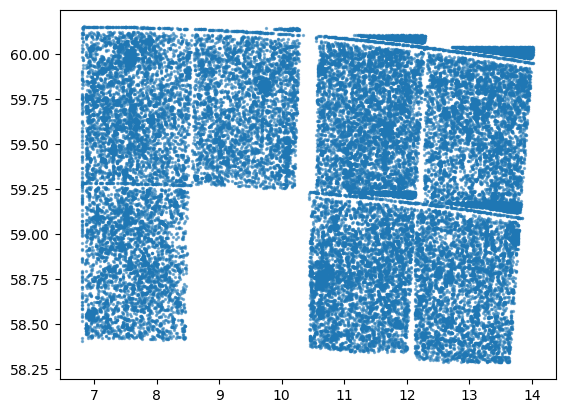

In [7]:
plt.scatter(g_tab['ra'], g_tab['dec'], s=2, alpha=0.5)
plt.show()

<SkyCoord (ICRS): (ra, dec) in deg
    (12.70851055, 59.1524507)>


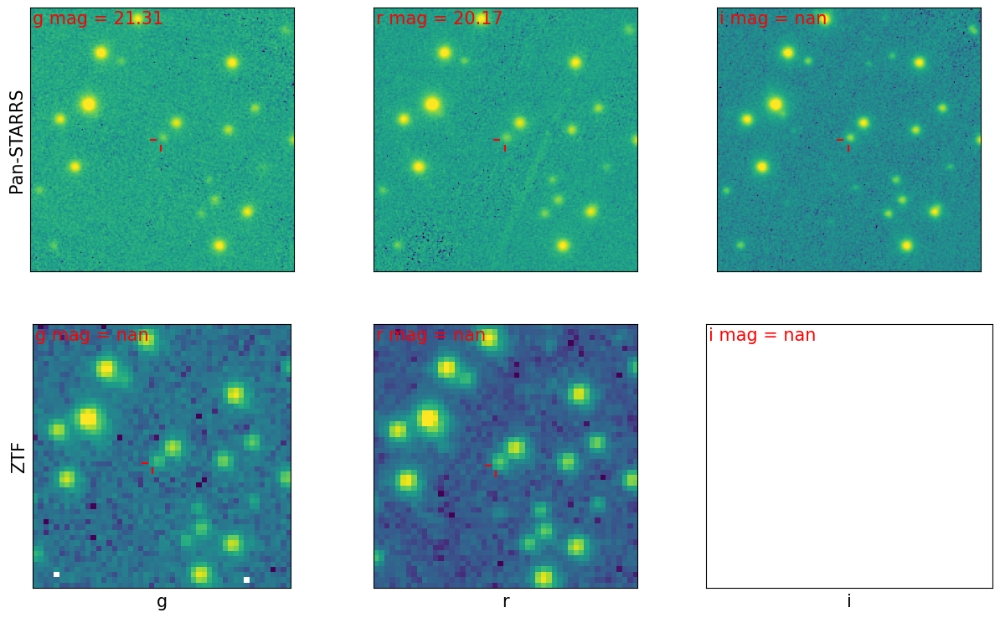

<SkyCoord (ICRS): (ra, dec) in deg
    (12.71264489, 59.15654283)>


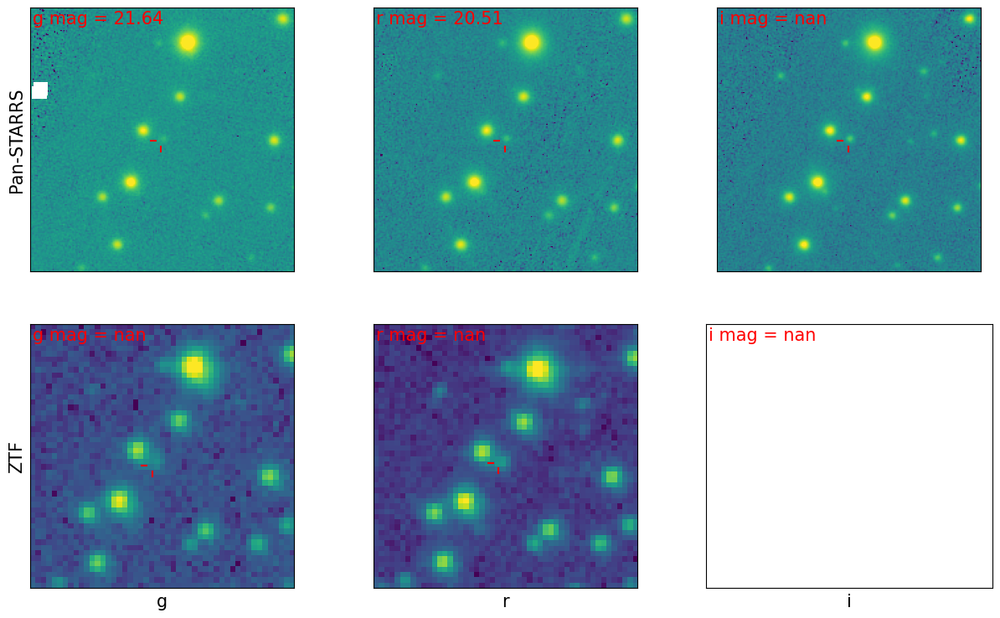

<SkyCoord (ICRS): (ra, dec) in deg
    (12.93182868, 59.1561027)>
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=field=000806+AND+ccdid=01+AND+qid=1
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmp73zogcm8/ztf_000806_zg_c01_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpfnpoc5mi/ztf_000806_zr_c01_q1_refimg.fits
Searching for source in the catalogs!
Searching g...
Searching r...
Searching i...


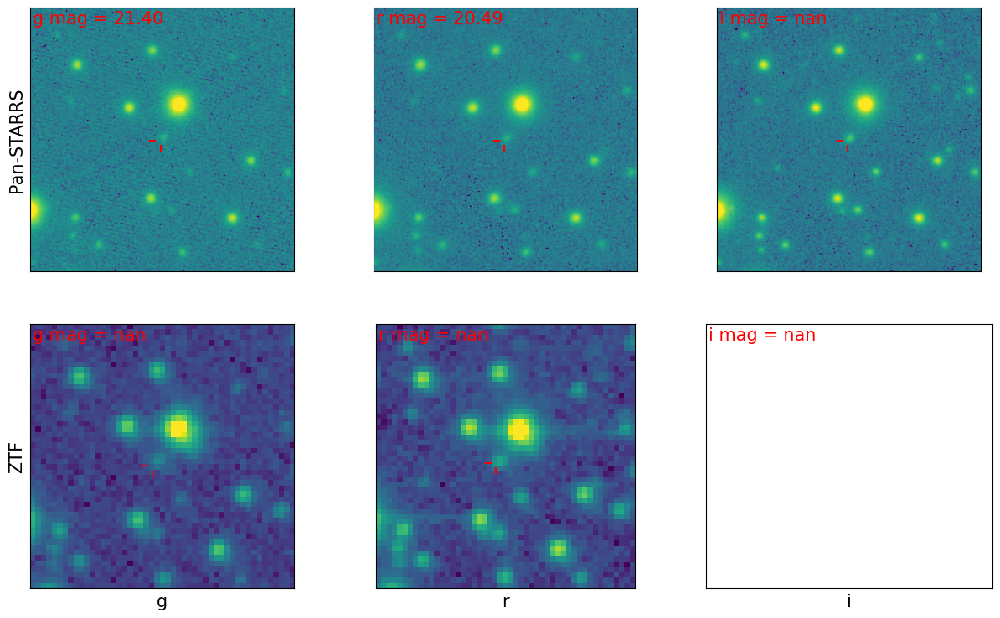

<SkyCoord (ICRS): (ra, dec) in deg
    (12.94131324, 59.15108133)>
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>12.496868791631872+AND+ra<13.385757691631873+AND+dec>58.7066368782715+AND+dec<59.5955257782715
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=field=000806+AND+ccdid=01+AND+qid=1
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmphyplzy3_/ztf_000806_zg_c01_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmp5z72h0fj/ztf_000806_zr_c01_q1_refimg.fits
Searching for source in the catalogs!
Searching g...
Searching r...
Searching i...


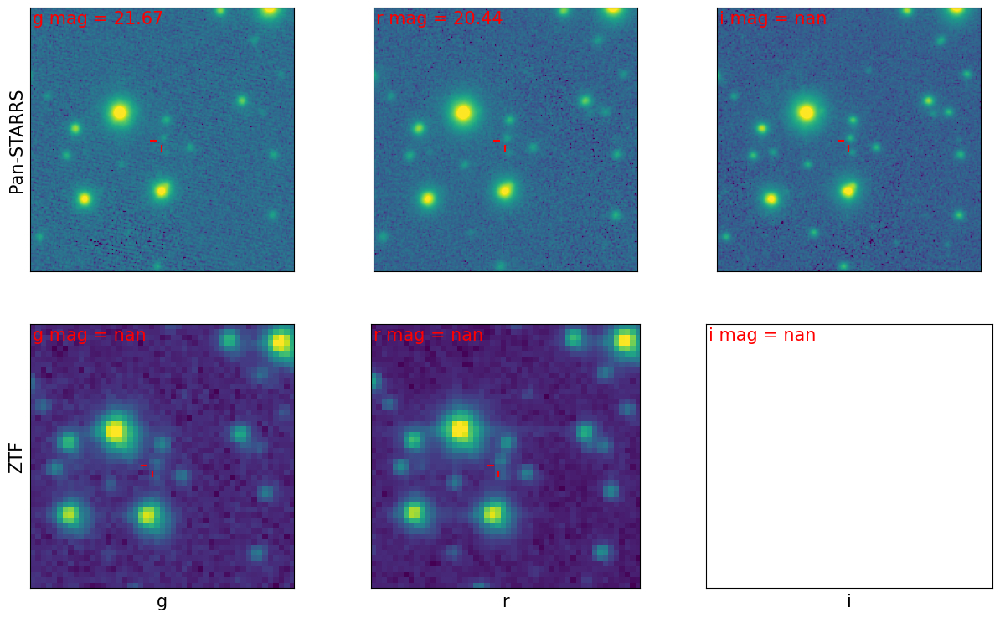

<SkyCoord (ICRS): (ra, dec) in deg
    (12.95132541, 59.15028087)>
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>12.506880960179563+AND+ra<13.395769860179565+AND+dec>58.705836422608165+AND+dec<59.59472532260816
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=field=000806+AND+ccdid=01+AND+qid=1
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmp3iarytij/ztf_000806_zg_c01_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpkwfuvfyo/ztf_000806_zr_c01_q1_refimg.fits
Searching for source in the catalogs!
Searching g...
Searching r...
Searching i...


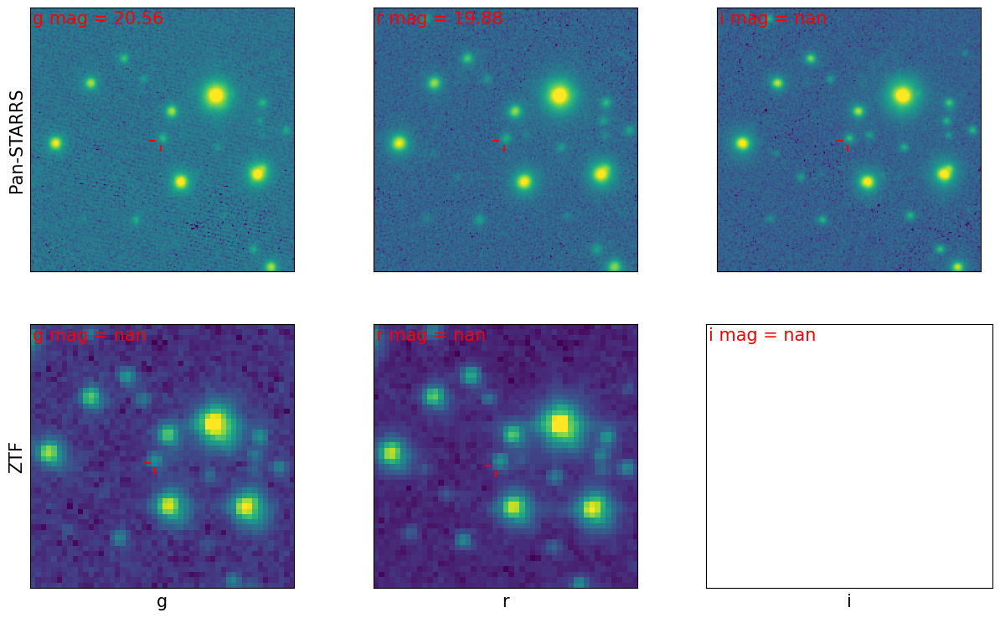

<SkyCoord (ICRS): (ra, dec) in deg
    (13.01806217, 59.15203847)>
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>12.573617722716072+AND+ra<13.462506622716074+AND+dec>58.70759402191089+AND+dec<59.59648292191089
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=field=000806+AND+ccdid=01+AND+qid=1
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpi1i6rkpr/ztf_000806_zg_c01_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpbn6r38x4/ztf_000806_zr_c01_q1_refimg.fits
Searching for source in the catalogs!
Searching g...
Searching r...
Searching i...


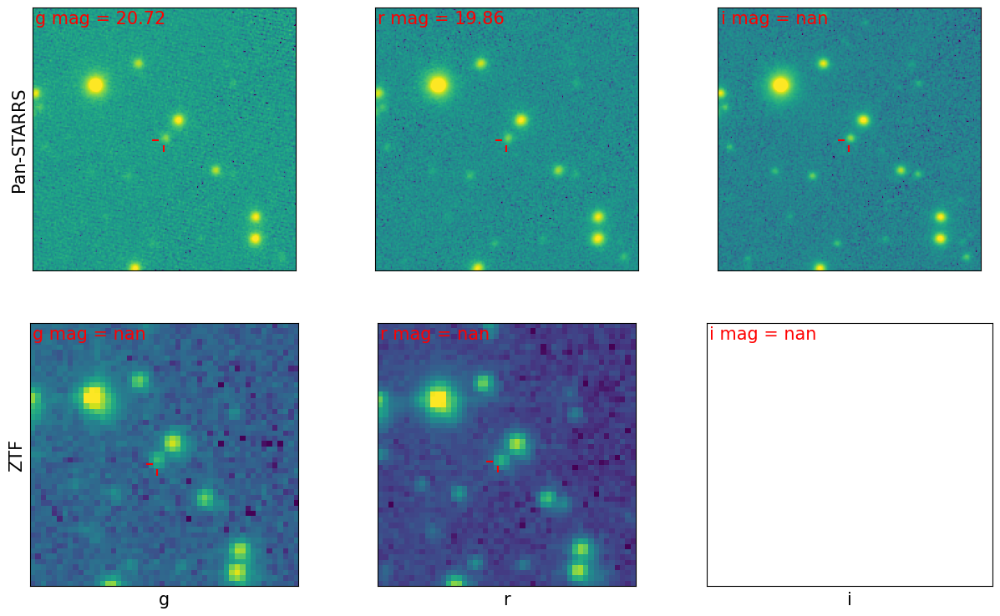

<SkyCoord (ICRS): (ra, dec) in deg
    (13.03137301, 59.15454296)>
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>12.586928560445005+AND+ra<13.475817460445006+AND+dec>58.7100985111201+AND+dec<59.5989874111201
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=field=000806+AND+ccdid=01+AND+qid=1
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpq9eic6qz/ztf_000806_zg_c01_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpzsc87_zc/ztf_000806_zr_c01_q1_refimg.fits
Searching for source in the catalogs!
Searching g...
Searching r...
Searching i...


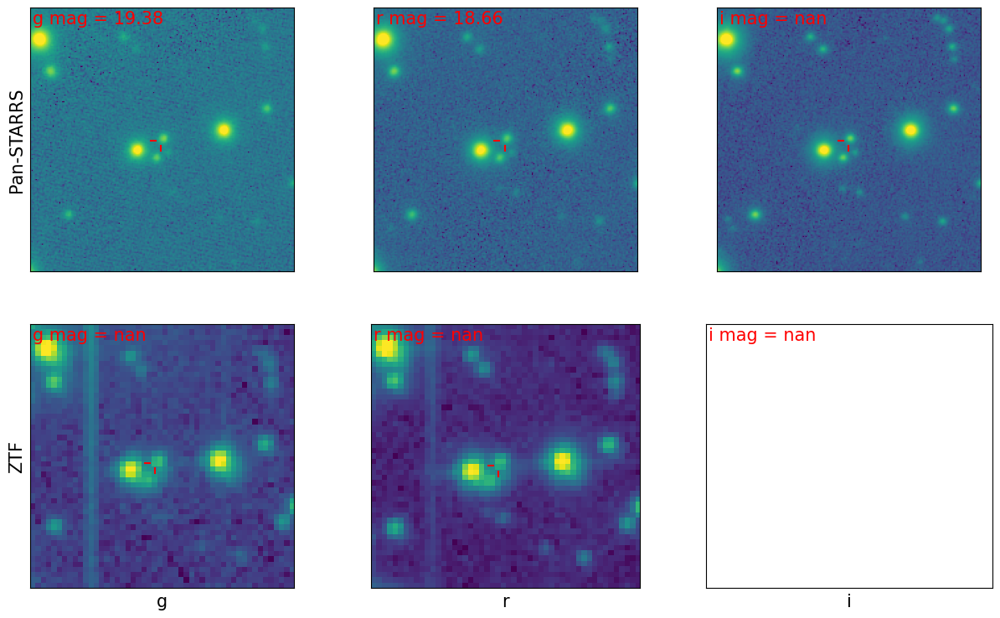

<SkyCoord (ICRS): (ra, dec) in deg
    (13.03216103, 59.15355119)>
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>12.587716578451786+AND+ra<13.476605478451788+AND+dec>58.709106735661706+AND+dec<59.597995635661704
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=field=000806+AND+ccdid=01+AND+qid=1
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmplb6sycsm/ztf_000806_zg_c01_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmp01z_3u74/ztf_000806_zr_c01_q1_refimg.fits
Searching for source in the catalogs!
Searching g...
Searching r...
Searching i...


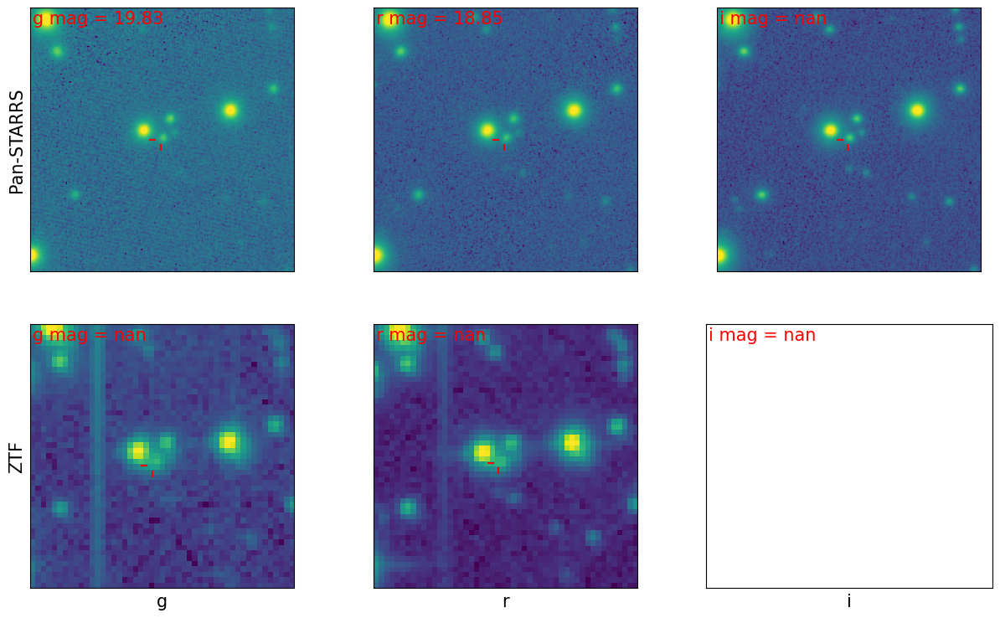

<SkyCoord (ICRS): (ra, dec) in deg
    (13.0545605, 59.15617391)>
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>12.610116051495009+AND+ra<13.49900495149501+AND+dec>58.711729459488254+AND+dec<59.60061835948825
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=field=000806+AND+ccdid=01+AND+qid=1
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmp7d9p6oib/ztf_000806_zg_c01_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpy83n34fg/ztf_000806_zr_c01_q1_refimg.fits
Searching for source in the catalogs!
Searching g...
Searching r...
Searching i...


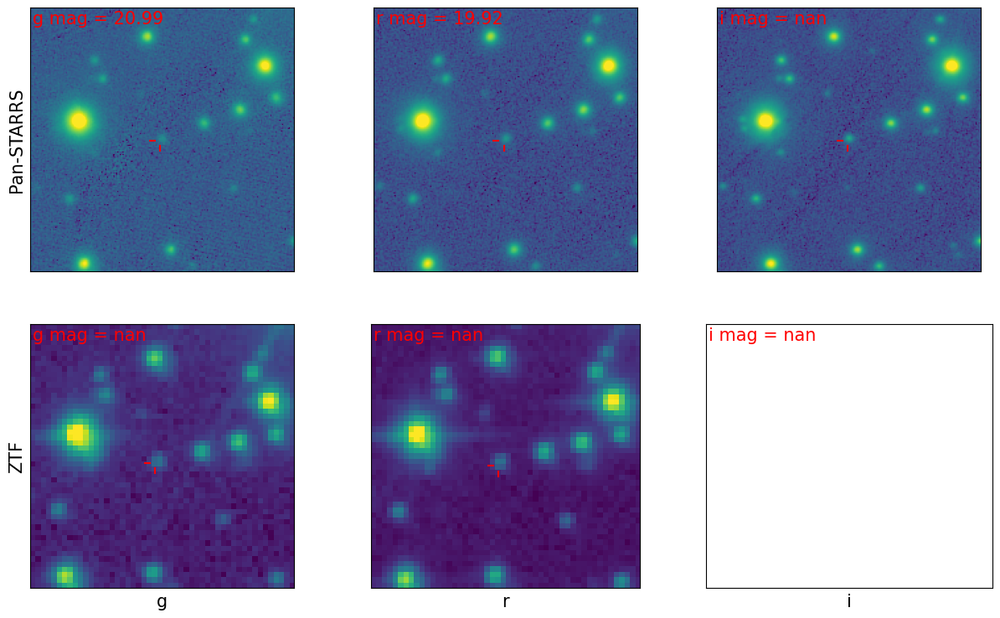

<SkyCoord (ICRS): (ra, dec) in deg
    (13.10993589, 59.15479654)>
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>12.665491441204077+AND+ra<13.554380341204078+AND+dec>58.71035208562618+AND+dec<59.599240985626174
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=field=000806+AND+ccdid=01+AND+qid=1
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmp_sm5nyuq/ztf_000806_zg_c01_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpw66q6r67/ztf_000806_zr_c01_q1_refimg.fits
Searching for source in the catalogs!
Searching g...
Searching r...
Searching i...


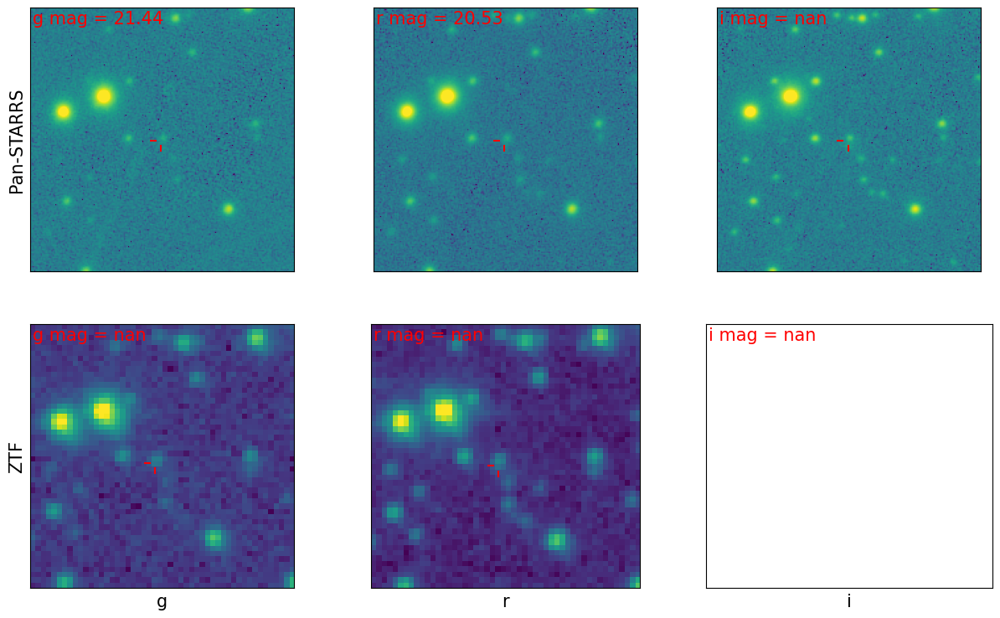

In [6]:
for src in srcs_pstarr[:10]:
    print(src.coord)
    # try:
    #     axes = src.plot_all_cutouts()
    # except:
    #     print('Encountered error, skipping...')
    axes = src.plot_all_cutouts()
    plt.show()

# Testing

In [2]:
g_tab = ascii.read('/Users/adamboesky/Research/long_transients/Data/filter_results/000445/0_g.ecsv')
r_tab = ascii.read('/Users/adamboesky/Research/long_transients/Data/filter_results/000445/0_r.ecsv')
i_tab = ascii.read('/Users/adamboesky/Research/long_transients/Data/filter_results/000445/0_i.ecsv')
g_tab

ra,dec,PSTARR_primaryDetection,PSTARR_rKronMagErr,PSTARR_iKronMagErr,PSTARR_rPSFMagErr,PSTARR_gApMagErr,PSTARR_rApMag,PSTARR_gPSFMagErr,PSTARR_iPSFMag,PSTARR_rKronMag,PSTARR_PanSTARR_ID,PSTARR_gPSFMag,PSTARR_gApMag,PSTARR_rinfoFlag2,PSTARR_ra,PSTARR_rpsfLikelihood,PSTARR_rApMagErr,PSTARR_rPSFMag,PSTARR_gKronMag,PSTARR_iinfoFlag2,PSTARR_iKronMag,PSTARR_ipsfLikelihood,PSTARR_gpsfLikelihood,PSTARR_iApMagErr,PSTARR_gKronMagErr,PSTARR_iPSFMagErr,PSTARR_iApMag,PSTARR_dec,PSTARR_ginfoFlag2,ZTF_i_thresh,ZTF_iPSFMagErr,ZTF_i_upper_lim_flag,ZTF_iPSFMag,ZTF_g_ymax,ZTF_r_b,ZTF_r_qid,ZTF_i_xcpeak,ZTF_g_theta,ZTF_r_ymax,ZTF_gPSFFlags,ZTF_g_x,ZTF_r_zero_pt_mag,ZTF_i_qid,ZTF_r_x2,ZTF_r_cflux,ZTF_r_ra,ZTF_g_erry2,ZTF_r_cpeak,ZTF_i_errxy,ZTF_r_tnpix,ZTF_g_y2,ZTF_r_xmax,ZTF_rPSFMagErr,ZTF_i_ra,ZTF_i_npix,ZTF_g_xmin,ZTF_i_x2,ZTF_rKronFlag,ZTF_g_a,ZTF_g_peak,ZTF_g_tnpix,ZTF_g_ymin,ZTF_g_mag_limit,ZTF_iKronMagErr,ZTF_i_cyy,ZTF_i_peak,ZTF_g_ccdid,ZTF_i_sepExtractionFlag,ZTF_g_xpeak,ZTF_g_flux,ZTF_i_ymax,ZTF_g_ra,ZTF_i_theta,ZTF_i_field,ZTF_r_ycpeak,ZTF_g_sepExtractionFlag,ZTF_i_ccdid,ZTF_g_errx2,ZTF_r_xmin,ZTF_g_zero_pt_mag,ZTF_g_npix,ZTF_g_xmax,ZTF_g_cxx,ZTF_g_ypeak,ZTF_r_a,ZTF_rKronMag,ZTF_i_qfit,ZTF_r_cfit,ZTF_i_xpeak,ZTF_g_qid,ZTF_g_cyy,ZTF_g_fieldid,ZTF_iPSFFlags,ZTF_i_ypeak,ZTF_i_cfit,ZTF_rPSFMag,ZTF_gKronMagErr,ZTF_g_y,ZTF_g_field,ZTF_r_field,ZTF_i_errx2,ZTF_g_qfit,ZTF_gPSFMagErr,ZTF_g_cfit,ZTF_r_erry2,ZTF_r_npix,ZTF_r_ypeak,ZTF_r_mag_limit,ZTF_g_xcpeak,ZTF_r_theta,ZTF_i_x,ZTF_i_ymin,ZTF_i_cxx,ZTF_i_cpeak,ZTF_r_y,ZTF_g_cpeak,ZTF_g_thresh,ZTF_i_fieldid,ZTF_r_thresh,ZTF_i_xy,ZTF_r_errx2,ZTF_iKronCircleFlag,ZTF_g_ycpeak,ZTF_g_dec,ZTF_r_xcpeak,ZTF_i_flux,ZTF_r_dec,ZTF_r_qfit,ZTF_i_zero_pt_mag,ZTF_r_xy,ZTF_i_xmax,ZTF_g_b,ZTF_i_mag_limit,ZTF_KronRad,ZTF_r_y2,ZTF_i_dec,ZTF_iKronFlag,ZTF_gKronMag,ZTF_r_cyy,ZTF_r_peak,ZTF_r_upper_lim_flag,ZTF_gPSFMag,ZTF_g_cflux,ZTF_r_flux,ZTF_rKronMagErr,ZTF_i_a,ZTF_i_erry2,ZTF_g_x2,ZTF_g_upper_lim_flag,ZTF_r_cxx,ZTF_rKronCircleFlag,ZTF_iKronMag,ZTF_g_cxy,ZTF_rPSFFlags,ZTF_i_tnpix,ZTF_i_cxy,ZTF_i_cflux,ZTF_r_x,ZTF_i_y2,ZTF_r_ymin,ZTF_i_ycpeak,ZTF_g_errxy,ZTF_g_xy,ZTF_r_cxy,ZTF_r_fieldid,ZTF_i_xmin,ZTF_i_y,ZTF_r_errxy,ZTF_r_xpeak,ZTF_r_ccdid,ZTF_r_sepExtractionFlag,ZTF_gKronCircleFlag,ZTF_gKronFlag,ZTF_i_b,association_separation_arcsec,Catalog,filter_info,Catalog_Flag,y,x
float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,str4,str29,float64,float64,float64
351.0301313780778,0.8866173557276054,1.0,0.01961600035429,0.0332879982888699,0.0123190004378557,nan,nan,0.0147639997303486,20.3679008483887,20.1842002868652,1.0906351030124435e+17,20.3234996795654,nan,524416.0,351.030155169114,0.078102

In [3]:
srcs = Sources(
    g_tab['ra'],
    g_tab['dec'],
    field_catalogs={
        'g': g_tab,
        'r': r_tab,
        'i': i_tab,
    },
    catch_plotting_exceptions=False)

<SkyCoord (ICRS): (ra, dec) in deg
    (351.03013138, 0.88661736)>
Searching for source in the catalogs!
Searching g...
Searching r...
Searching i...
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=field=000445+AND+ccdid=13+AND+qid=1
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpcls9vxl4/ztf_000445_zr_c13_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpukwpxn3i/ztf_000445_zi_c13_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpl4uvdsc0/ztf_000445_zg_c13_q1_refimg.fits


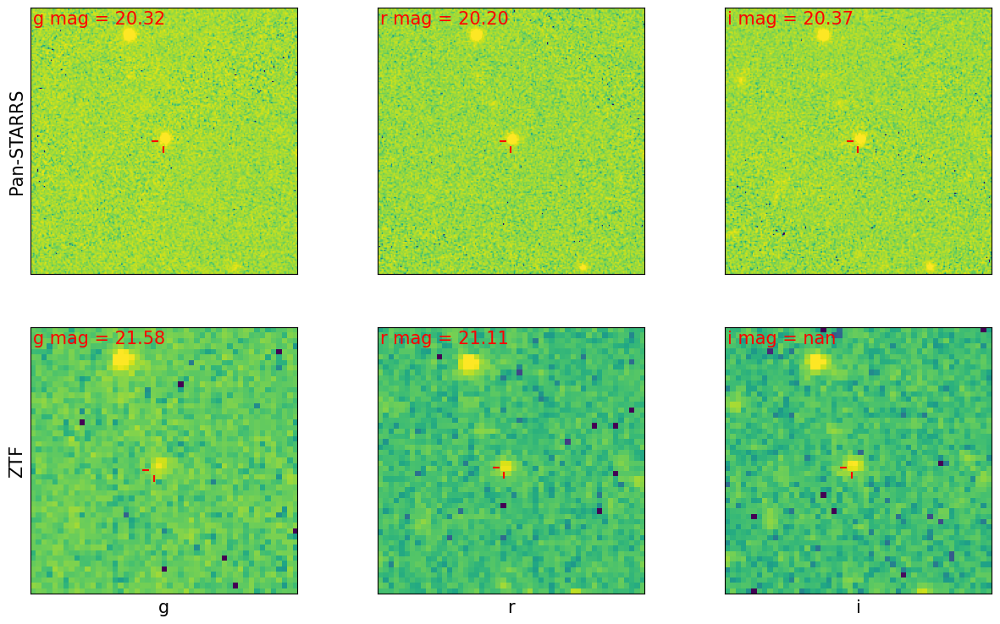

Querying ztf catalog for light curve...
Querying wise catalog for light curve...
Querying ptf catalog for light curve...


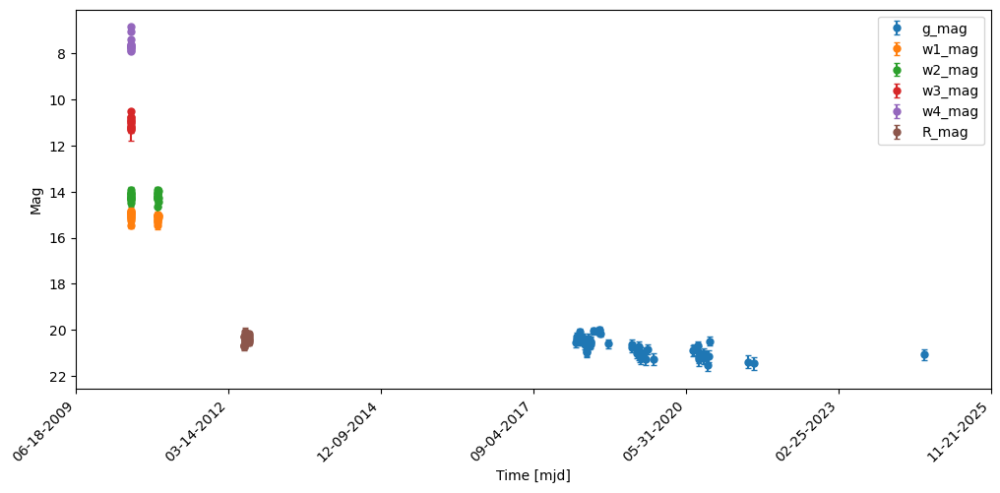

<SkyCoord (ICRS): (ra, dec) in deg
    (345.46067882, -3.23380541)>
Searching for source in the catalogs!
Searching g...
Searching r...
Searching i...

Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=field=000445+AND+ccdid=08+AND+qid=1

Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpia8yx426/ztf_000445_zi_c08_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmp5d8okjhl/ztf_000445_zr_c08_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpry66argl/ztf_000445_zg_c08_q1_refimg.fits


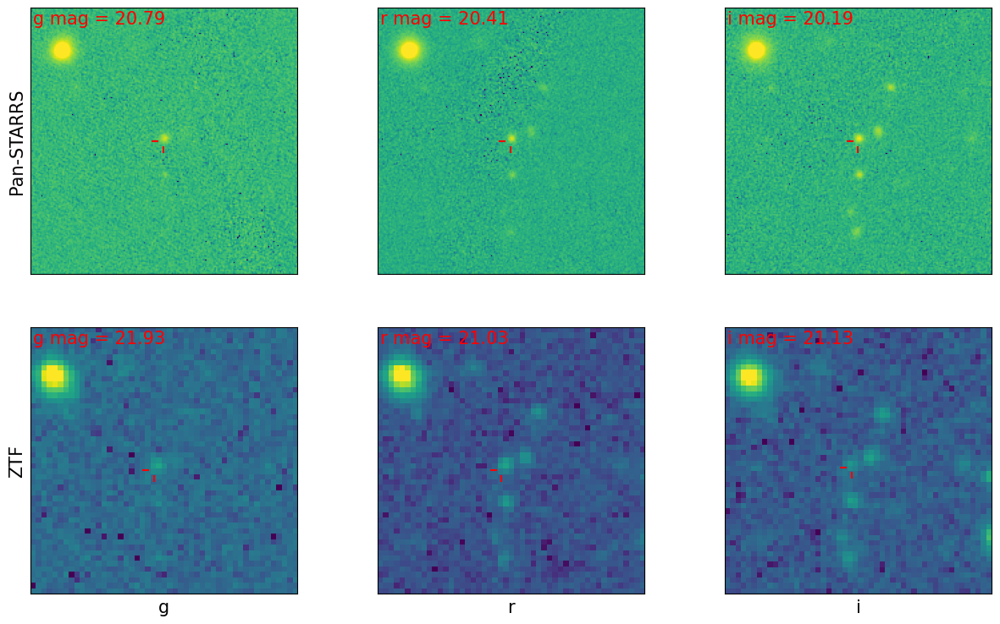

Querying ztf catalog for light curve...Querying wise catalog for light curve...
Querying ptf catalog for light curve...



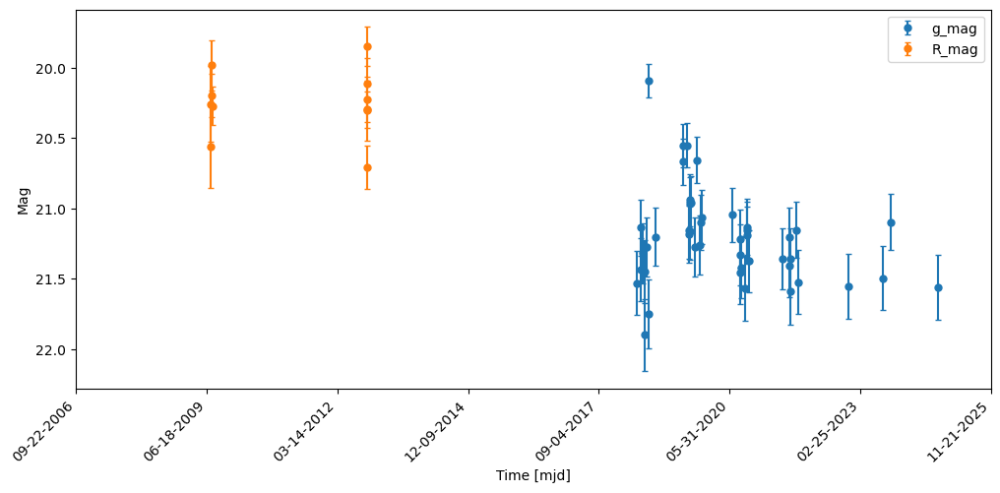

<SkyCoord (ICRS): (ra, dec) in deg
    (345.27645452, -3.41461172)>
Searching for source in the catalogs!
Searching g...
Searching r...
Searching i...

Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=field=000445+AND+ccdid=08+AND+qid=1

Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpzdnwulhr/ztf_000445_zr_c08_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpe8ncvxro/ztf_000445_zi_c08_q1_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmp_n_llhxv/ztf_000445_zg_c08_q1_refimg.fits


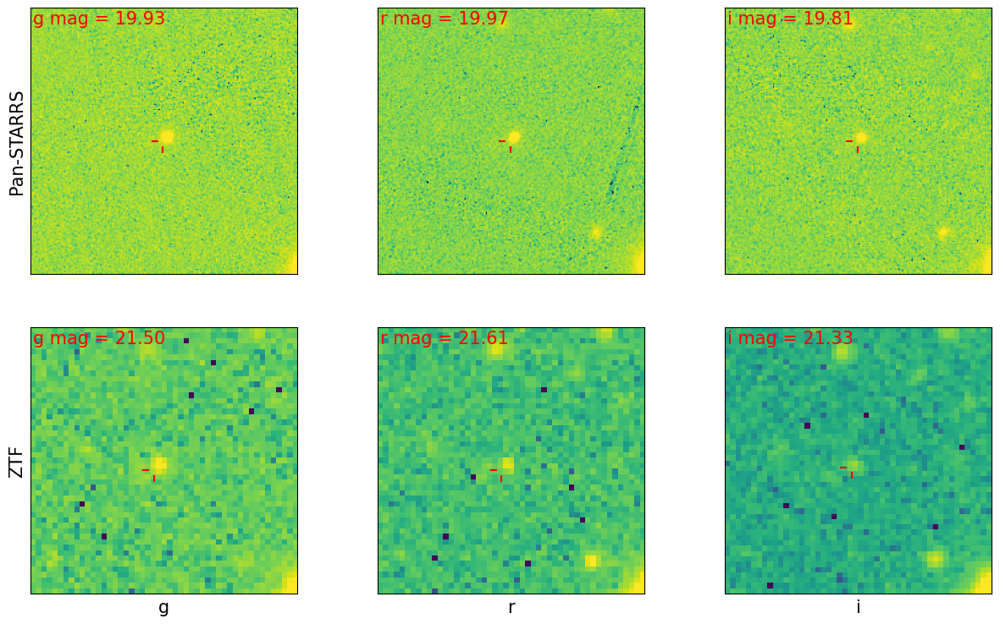

Querying ztf catalog for light curve...
Querying wise catalog for light curve...
Querying ptf catalog for light curve...


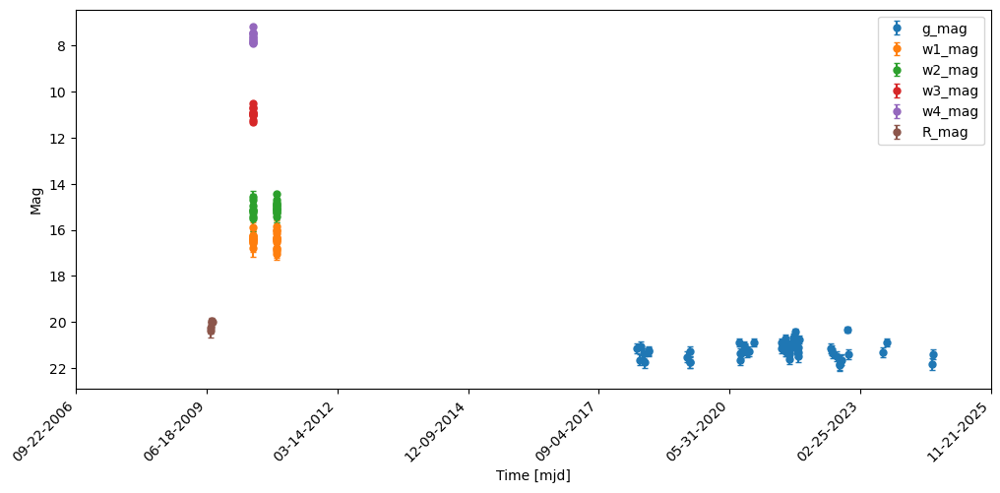

<SkyCoord (ICRS): (ra, dec) in deg
    (344.89075071, -0.4894742)>
Searching for source in the catalogs!
Searching g...
Searching r...
Searching i...
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=field=000445+AND+ccdid=16+AND+qid=3

Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmp4v5xofzk/ztf_000445_zg_c16_q3_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpmpzqiall/ztf_000445_zi_c16_q3_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmps9y4ej_5/ztf_000445_zr_c16_q3_refimg.fits


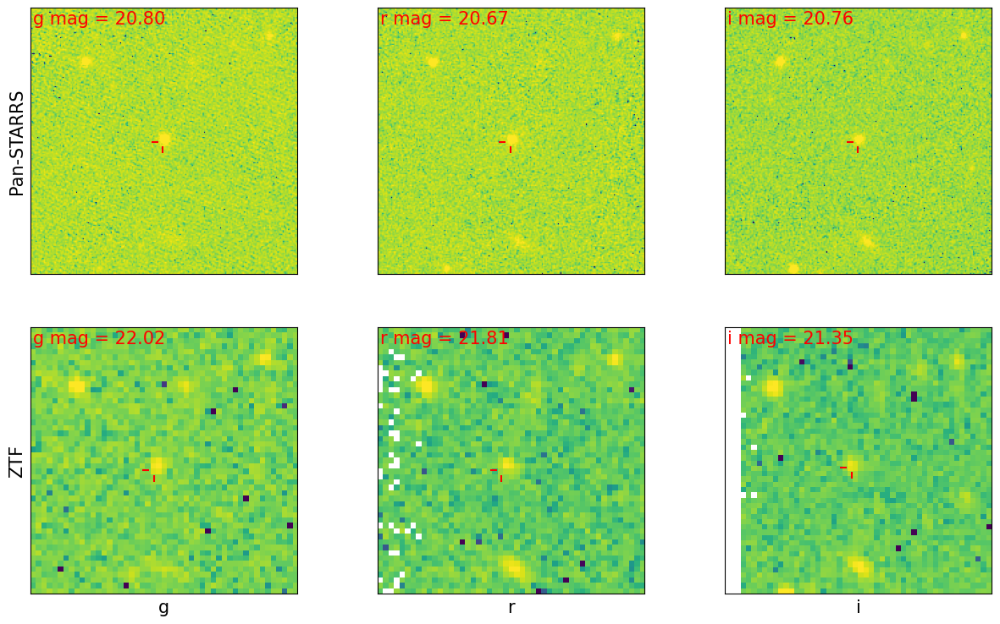

Querying ztf catalog for light curve...
Querying wise catalog for light curve...
Querying ptf catalog for light curve...


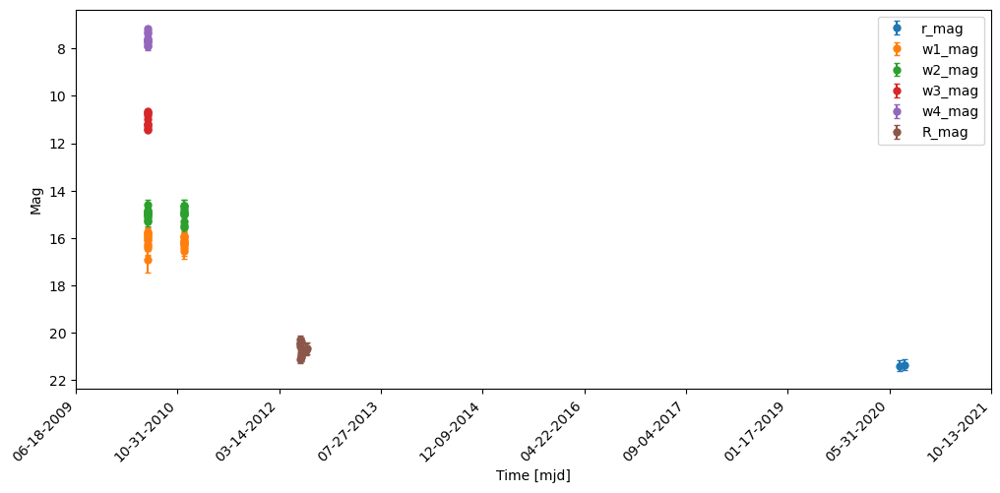

<SkyCoord (ICRS): (ra, dec) in deg
    (344.17044207, 0.92732671)>
Searching for source in the catalogs!
Searching g...
Searching r...
Searching i...
Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=field=000445+AND+ccdid=16+AND+qid=2

Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpudyn81jr/ztf_000445_zg_c16_q2_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpb0m13ipp/ztf_000445_zi_c16_q2_refimg.fits
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpanvyadw6/ztf_000445_zr_c16_q2_refimg.fits


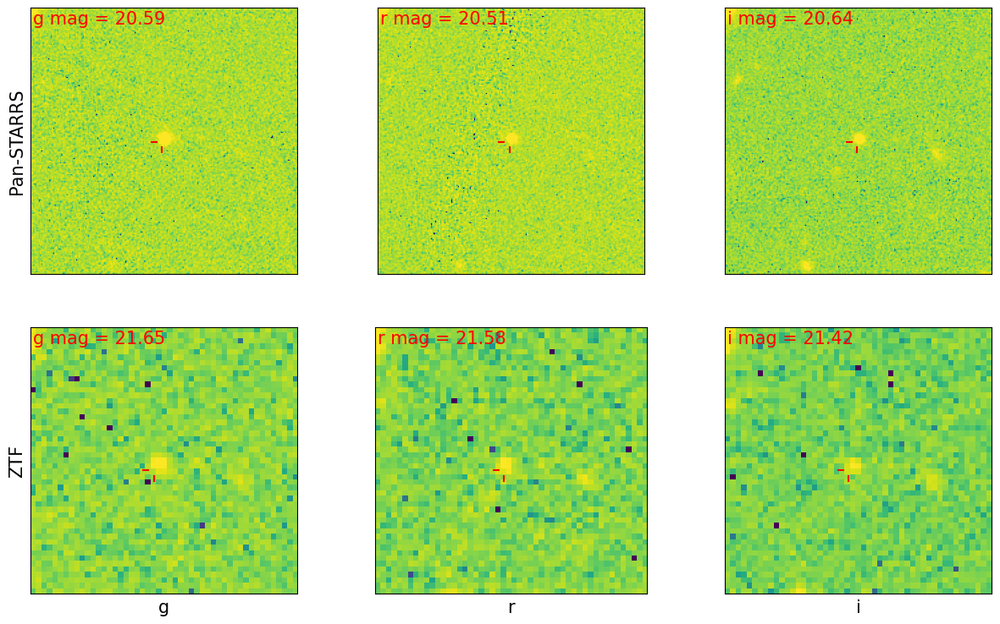

Querying ztf catalog for light curve...
Querying wise catalog for light curve...
Querying ptf catalog for light curve...


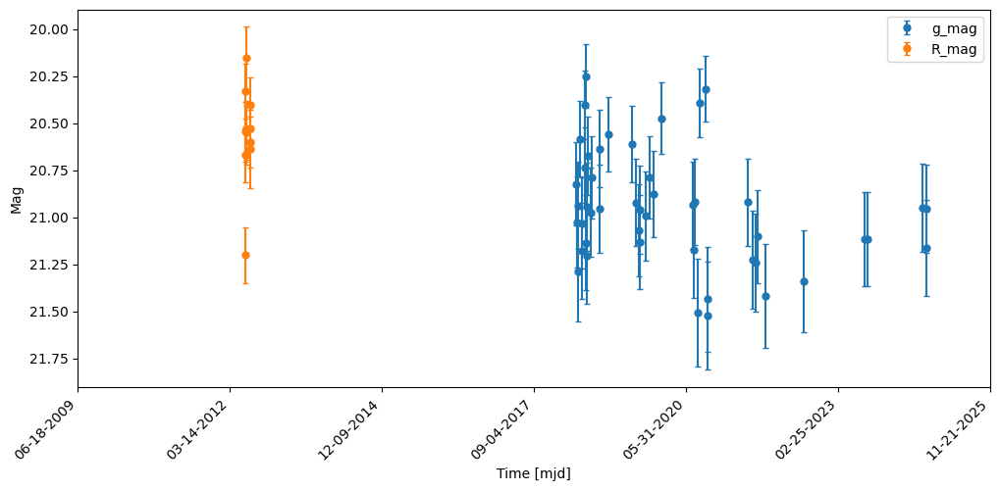

In [4]:
for src in srcs:
    print(src.coord)
    src.plot_all_cutouts()
    plt.show()
    src.plot_lc()
    plt.show()